# BANJIR: MODEL PREDIKSI (A2)

---

In [1]:
# import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from scipy.signal import savgol_filter
from sklearn.preprocessing import MinMaxScaler
import joblib

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout, Bidirectional
from tensorflow.keras.initializers import GlorotNormal, Zeros
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import MeanAbsoluteError, MeanSquaredError, RootMeanSquaredError
from sklearn.metrics import mean_absolute_error, mean_squared_error

import os
import sys
import warnings

In [2]:
# FUNCTIONS

''' EDA '''
def plot_eda_grafik(col='col'): 
    plt.figure(figsize=(15, 3))
    plt.plot(data[col][1000:2100], '-')
    plt.title("Bentuk Data", fontweight='bold', fontsize= 14)
    plt.ylabel(col) #
    plt.legend([col], loc='upper right') #
    plt.show()
    
def plot_eda_dist_scatter(col='col'):
    plt.figure(figsize=(15, 3))
    plt.subplot(121) # row , col , index 
    sns.distplot(data[col], kde=True)                   
    plt.legend([col], loc='upper right') 
    plt.title("Distribusi Data", fontweight='bold', fontsize= 14)   
    plt.subplot(122) 
    sns.scatterplot(x=data[col], y=data['height']) 
    plt.axhline(150, color='grey', linestyle='dotted')
    plt.title('Scatter Plot', fontweight='bold', fontsize= 14)
    plt.show()

def col_info_lag(column):
    print('Persentase',column,' :', (data[(data150[column].min()<=data[column]) & (data[column]<=data150[column].max())].shape[0]/len(data)*100), '%')
    print('Persentase lag 3h :', (data[(data150[column+'_3h'].min()<=data[column+'_3h']) & (data[column+'_3h']<=data150[column+'_3h'].max())].shape[0]/len(data)*100), '%')
    print('Persentase lag 6h :', (data[(data150[column+'_6h'].min()<=data[column+'_6h']) & (data[column+'_6h']<=data150[column+'_6h'].max())].shape[0]/len(data)*100), '%')
    print('Persentase lag 12h:', (data[((data150[column+'_12h'].min()<=data[column+'_12h']) & (data[column+'_12h']<=data150[column+'_12h'].max()))].shape[0]/len(data)*100), '%')
    print('Persentase lag 18h:', (data[((data150[column+'_18h'].min()<=data[column+'_18h']) & (data[column+'_18h']<=data150[column+'_18h'].max()))].shape[0]/len(data)*100), '%')
    return data150[[column,column+'_3h', column+'_6h', column+'_12h', column+'_18h']].describe().T

def col_info_diff(column):
    print('Persentase diff 3h :', (data[(data150[column+'_diff_3h'].min()<=data[column+'_diff_3h']) & (data[column+'_diff_3h']<=data150[column+'_diff_3h'].max())].shape[0]/len(data)*100), '%')
    print('Persentase diff 6h :', (data[(data150[column+'_diff_6h'].min()<=data[column+'_diff_6h']) & (data[column+'_diff_6h']<=data150[column+'_diff_6h'].max())].shape[0]/len(data)*100), '%')
    print('Persentase diff 12h:', (data[((data150[column+'_diff_12h'].min()<=data[column+'_diff_12h']) & (data[column+'_diff_12h']<=data150[column+'_diff_12h'].max()))].shape[0]/len(data)*100), '%')
    print('Persentase diff 18h:', (data[((data150[column+'_diff_18h'].min()<=data[column+'_diff_18h']) & (data[column+'_diff_18h']<=data150[column+'_diff_18h'].max()))].shape[0]/len(data)*100), '%')
    return data150[[column+'_diff_3h', column+'_diff_6h', column+'_diff_12h', column+'_diff_18h']].describe().T


''' WINDOWING '''
# fungsi window
def create_window(data, window_size, future_size, label):
    X_window = []
    y_window = []

    for i in range(len(data) - window_size - future_size):
        X_window.append(data[i:i+window_size])
        y_window.append(label[i+window_size:i+window_size+future_size])

    return np.array(X_window), np.array(y_window)


''' MODELING'''
# Define a learning rate schedule function
def lr_schedule(epoch):
    if epoch <= 20:
        return 0.0001
    else:
        return 0.00001

def plot_loss(history, model_name):
    plt.figure(figsize = (6, 4))
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Train vs Validation (Loss) for ' + model_name,  fontsize= 12)
    plt.ylabel('Loss (MSE)')
    plt.xlabel('Epoch')
    plt.legend(['Train loss', 'Validation loss'], loc='upper right')
    
def plot_mae(history, model_name):
    plt.figure(figsize = (6, 4))
    plt.plot(history.history['mean_absolute_error'])
    plt.plot(history.history['val_mean_absolute_error'])
    plt.title('Train vs Validation (MAE) for ' + model_name,  fontsize= 12)
    plt.ylabel('MAE')
    plt.xlabel('Epoch')
    plt.legend(['Train mae', 'Validation mae'], loc='upper right')

def create_time_steps(length):
    return list(range(-length, 0))

def plot_pred0(history, true_future, prediction):
    plt.figure(figsize=(10, 4))
    num_in = create_time_steps(len(history))
    num_out = len(true_future)

    plt.plot(num_in, np.array(history), 'k.', label='History')
    plt.plot(np.arange(num_out), np.array(true_future), '.',
           label='True Future')
    if prediction.any():
        plt.plot(np.arange(num_out), np.array(prediction), 'r.',
                 label='Predicted Future')
        
    plt.title('Plot Prediction', fontsize= 12)
    plt.legend(loc='upper left')
    plt.show()

def plot_pred1(history, true_future, prediction):
    plt.figure(figsize=(10, 4))
    num_in = create_time_steps(len(history))
    num_out = len(true_future)

    plt.plot(num_in, np.array(history), 'k.', label='History')
    plt.plot(np.arange(num_out), np.array(true_future), '.',
           label='True Future')
    if prediction.any():
        plt.plot(np.arange(num_out), np.array(prediction), 'r.',
                 label='Predicted Future')
        
    plt.title('Plot Prediction', fontsize= 12)
    plt.legend(loc='upper left')
    plt.ylim(0, 1)  # Mengatur rentang sumbu y dari 0 hingga 1
    plt.show()

# def eval(model, X_train_window, X_val_window, X_test_window, y_train_window, y_val_window, y_test_window):
#     y_pred_train = model.predict(X_train_window)
#     y_pred_val = model.predict(X_val_window)
#     y_pred_test = model.predict(X_test_window)
    
#     print("Hasil evaluasi:")
#     print("MAE on train data: ",mean_absolute_error(y_train_window, y_pred_train).round(5))
#     print("MSE on train data: ", mean_squared_error(y_train_window, y_pred_train).round(5))
#     print("MAE on validation data: ",mean_absolute_error(y_val_window, y_pred_val).round(5))
#     print("MSE on validation data: ", mean_squared_error(y_val_window, y_pred_val).round(5))
#     print("MAE on test data: ", mean_absolute_error(y_test_window, y_pred_test).round(5))
#     print("MSE on test data: ", mean_squared_error(y_test_window, y_pred_test).round(5))

def eval_df(model, X_train_window, X_val_window, X_test_window, y_train_window, y_val_window, y_test_window):
    # Evaluasi model pada data pelatihan dan data pengujian
    train_results = model.evaluate(X_train_window, y_train_window)
    val_results = model.evaluate(X_val_window, y_val_window)
    test_results = model.evaluate(X_test_window, y_test_window)

    # train MAE, MSE, RMSE
    train_mae, train_mse, train_rmse = train_results[1], train_results[0], train_results[2]
    # val MAE, MSE, RMSE
    val_mae, val_mse, val_rmse = val_results[1], val_results[0], val_results[2]
    # val MAE, MSE, RMSE
    test_mae, test_mse, test_rmse = test_results[1], test_results[0], test_results[2]

    # Membuat dataframe untuk hasil evaluasi
    evaluation_results = pd.DataFrame({'MAE': [train_mae, val_mae, test_mae],
                                       'MSE': [train_mse, val_mse, test_mse],
                                       'RMSE': [train_rmse, val_rmse, test_rmse]},
                                      index=['Train', 'Val', 'Test'])
    # Menampilkan dataframe
    return evaluation_results.round(4)

In [3]:
# setting
# display max columns
pd.set_option('display.max_columns', None)

# ignore warnings
warnings.filterwarnings('ignore')

In [4]:
# system info
print('python/system version:', sys.version)
print('tf version:', tf.__version__)
print('gpu num:', len(tf.config.experimental.list_physical_devices('GPU')))
print('cuda:', tf.test.is_built_with_cuda())

python/system version: 3.9.16 (main, Jan 11 2023, 16:16:36) [MSC v.1916 64 bit (AMD64)]
tf version: 2.10.0
gpu num: 1
cuda: True


## - DATA UNDERSTANDING

In [5]:
# read dataset
data = pd.read_csv('dataset/dataset_saved-A/dataset_A2/flood-A2_modeling.csv')
data

,date,height,temp,feelslike,dew,humidity,precip,precipprob,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,severerisk
0,03/06/2022 00:00,23.52,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,10
1,03/06/2022 00:10,24.45,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,10
2,03/06/2022 00:20,25.37,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,10
3,03/06/2022 00:30,26.29,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,10
4,03/06/2022 00:40,27.21,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13995,08/09/2022 04:30,58.89,18.6,18.6,17.6,93.91,0.0,0,4.7,6.5,84.6,1013,100.0,24.1,10
13996,08/09/2022 04:40,59.57,18.6,18.6,17.6,93.91,0.0,0,4.7,6.5,84.6,1013,100.0,24.1,10
13997,08/09/2022 04:50,59.69,18.6,18.6,17.6,93.91,0.0,0,4.7,6.5,84.6,1013,100.0,24.1,10
13998,08/09/2022 05:00,59.67,19.0,19.0,17.3,89.87,0.0,0,4.7,6.5,81.5,1013,100.0,24.1,10


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14000 entries, 0 to 13999
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   date              14000 non-null  object 
 1   height            14000 non-null  float64
 2   temp              14000 non-null  float64
 3   feelslike         14000 non-null  float64
 4   dew               14000 non-null  float64
 5   humidity          14000 non-null  float64
 6   precip            14000 non-null  float64
 7   precipprob        14000 non-null  int64  
 8   windgust          14000 non-null  float64
 9   windspeed         14000 non-null  float64
 10  winddir           14000 non-null  float64
 11  sealevelpressure  14000 non-null  int64  
 12  cloudcover        14000 non-null  float64
 13  visibility        14000 non-null  float64
 14  severerisk        14000 non-null  int64  
dtypes: float64(11), int64(3), object(1)
memory usage: 1.6+ MB


In [7]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
height,14000.0,51.292151,24.178689,21.98,34.57,45.14,59.5825,204.42
temp,14000.0,21.766214,2.825473,17.50,19.60,20.50,24.0000,29.80
feelslike,14000.0,21.846400,3.001786,17.50,19.60,20.50,24.0000,31.00
dew,14000.0,19.255143,1.506380,13.90,18.40,19.30,20.2000,23.20
humidity,14000.0,86.922140,13.231809,45.86,79.64,92.88,96.9600,100.00
precip,14000.0,0.460029,1.716985,0.00,0.00,0.00,0.3000,33.60
precipprob,14000.0,40.371429,49.065900,0.00,0.00,0.00,100.0000,100.00
windgust,14000.0,4.871643,2.411981,0.70,3.20,4.30,6.1000,26.30
windspeed,14000.0,4.640386,2.019249,0.00,3.20,4.70,5.8000,11.50
winddir,14000.0,156.146300,94.399413,1.00,77.20,98.20,252.8000,359.80


### Cek Korelasi (1)
Memilih fitur yang tidak redundan, korelasi antar fitur < 0.5

<AxesSubplot: >

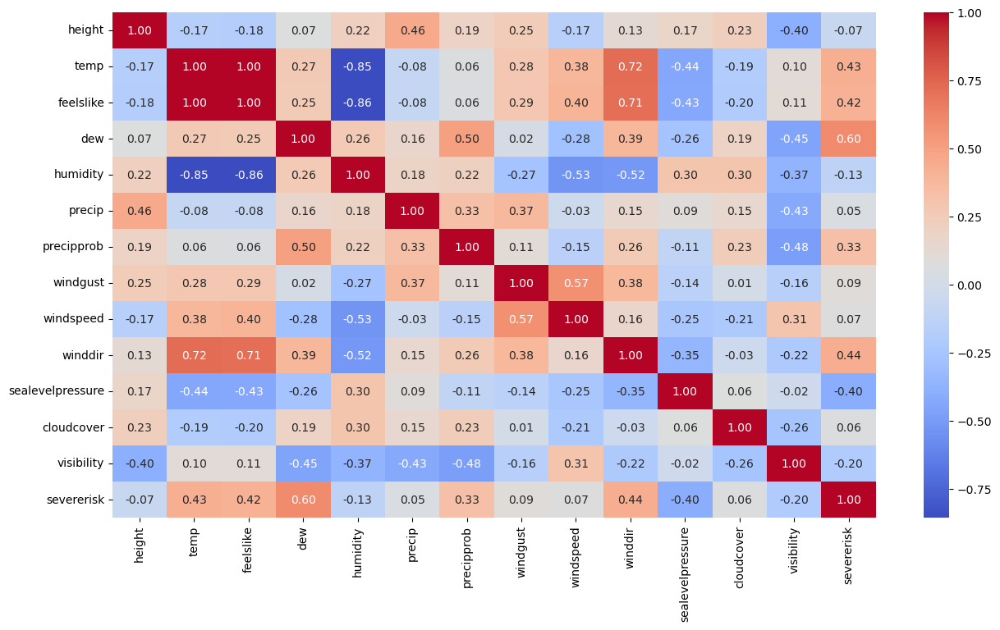

In [8]:
# cek korelasi
plt.figure(figsize=(15,8))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f')
#plt.savefig('corr.png')

Nilai positif menunjukkan hubungan yang positif, misal hubungan precip dan height, semakin besar nilai precip maka semakin besar juga nilai height. Nilai negatif menunjukkan hubungan yang negatif, misalnya hubungan windspeed dengan height.

Karena terdapat banyak fitur, kita akan memilih beberapa fitur untuk dilakukan eksplorasi lebih dalam. Pertama, memastikan fitur yang dipilih tidak redundan/memiliki kesamaan informasi dengan fitur lainnya(digunakan treshold 0.5)

Fitur redundan:
- 'temp', 
- 'feelslike', 
- 'precipprob',
- 'windspeed',
- 'winddir', 
- 'severerisk'

Lalu, akan mengekstrak selain fitur di atas untuk melihat apakah ada fitur baru yang memiliki korelasi tinggi dengan 'height'

### Feature Extraction

In [9]:
# menyesuaikan format date
data['date'] = data['date'] + ':00'
data['date'] = pd.to_datetime(data['date'], format='%d/%m/%Y %H:%M:%S')

''' LAG '''
# NILAI SEBELUMNYA (LAG FEATURE) 3H
data['height_3h'] = data['height'].shift(18)
data['dew_3h'] = data['dew'].shift(18) 
data['humidity_3h'] = data['humidity'].shift(18)
data['precip_3h'] = data['precip'].shift(18) 
data['windgust_3h'] = data['windgust'].shift(18)
data['sealevelpressure_3h'] = data['sealevelpressure'].shift(18)
data['cloudcover_3h'] = data['cloudcover'].shift(18)
data['visibility_3h'] = data['visibility'].shift(18)
# NILAI SEBELUMNYA (LAG FEATURE) 6H
data['height_6h'] = data['height'].shift(36) #36=back, -36=forward
data['dew_6h'] = data['dew'].shift(36) 
data['humidity_6h'] = data['humidity'].shift(36)
data['precip_6h'] = data['precip'].shift(36) 
data['windgust_6h'] = data['windgust'].shift(36)
data['sealevelpressure_6h'] = data['sealevelpressure'].shift(36)
data['cloudcover_6h'] = data['cloudcover'].shift(36)
data['visibility_6h'] = data['visibility'].shift(36)
# NILAI SEBELUMNYA (LAG FEATURE) 12H
data['height_12h'] = data['height'].shift(72)
data['dew_12h'] = data['dew'].shift(72) 
data['humidity_12h'] = data['humidity'].shift(72)
data['precip_12h'] = data['precip'].shift(72) 
data['windgust_12h'] = data['windgust'].shift(72)
data['sealevelpressure_12h'] = data['sealevelpressure'].shift(72)
data['cloudcover_12h'] = data['cloudcover'].shift(72)
data['visibility_12h'] = data['visibility'].shift(72)
# NILAI SEBELUMNYA (LAG FEATURE) 18H
data['height_18h'] = data['height'].shift(108)
data['dew_18h'] = data['dew'].shift(108) 
data['humidity_18h'] = data['humidity'].shift(108)
data['precip_18h'] = data['precip'].shift(108) 
data['windgust_18h'] = data['windgust'].shift(108)
data['sealevelpressure_18h'] = data['sealevelpressure'].shift(108)
data['cloudcover_18h'] = data['cloudcover'].shift(108)
data['visibility_18h'] = data['visibility'].shift(108)


''' DIFFERENCE '''
# FITUR BARU: SELISIH DENGAN NILAI 3H SEBELUMNYA  
data['height_diff_3h'] = data['height'] - data['height'].shift(18) 
data['dew_diff_3h'] = data['dew'] - data['dew'].shift(18) 
data['humidity_diff_3h'] = data['humidity'] - data['humidity'].shift(18)
data['precip_diff_3h'] = data['precip'] - data['precip'].shift(18) 
data['windgust_diff_3h'] = data['windgust'] - data['windgust'].shift(18)
data['sealevelpressure_diff_3h'] = data['sealevelpressure'] - data['sealevelpressure'].shift(18)
data['cloudcover_diff_3h'] = data['cloudcover'] - data['cloudcover'].shift(18)
data['visibility_diff_3h'] = data['visibility'] - data['visibility'].shift(18)
# FITUR BARU: SELISIH DENGAN NILAI 6H SEBELUMNYA  
data['height_diff_6h'] = data['height'] - data['height'].shift(36) 
data['dew_diff_6h'] = data['dew'] - data['dew'].shift(36) 
data['humidity_diff_6h'] = data['humidity'] - data['humidity'].shift(36)
data['precip_diff_6h'] = data['precip'] - data['precip'].shift(36) 
data['windgust_diff_6h'] = data['windgust'] - data['windgust'].shift(36)
data['sealevelpressure_diff_6h'] = data['sealevelpressure'] - data['sealevelpressure'].shift(36)
data['cloudcover_diff_6h'] = data['cloudcover'] - data['cloudcover'].shift(36)
data['visibility_diff_6h'] = data['visibility'] - data['visibility'].shift(36)
# FITUR BARU: SELISIH DENGAN NILAI 12H SEBELUMNYA  
data['height_diff_12h'] = data['height'] - data['height'].shift(72)
data['dew_diff_12h'] = data['dew'] - data['dew'].shift(72) 
data['humidity_diff_12h'] = data['humidity'] - data['humidity'].shift(72)
data['precip_diff_12h'] = data['precip'] - data['precip'].shift(72) 
data['windgust_diff_12h'] = data['windgust'] - data['windgust'].shift(72)
data['sealevelpressure_diff_12h'] = data['sealevelpressure'] - data['sealevelpressure'].shift(72)
data['cloudcover_diff_12h'] = data['cloudcover'] - data['cloudcover'].shift(72)
data['visibility_diff_12h'] = data['visibility'] - data['visibility'].shift(72)
# FITUR BARU: SELISIH DENGAN NILAI 24H SEBELUMNYA  
data['height_diff_18h'] = data['height'] - data['height'].shift(108)
data['dew_diff_18h'] = data['dew'] - data['dew'].shift(108) 
data['humidity_diff_18h'] = data['humidity'] - data['humidity'].shift(108)
data['precip_diff_18h'] = data['precip'] - data['precip'].shift(108) 
data['windgust_diff_18h'] = data['windgust'] - data['windgust'].shift(108)
data['sealevelpressure_diff_18h'] = data['sealevelpressure'] - data['sealevelpressure'].shift(108)
data['cloudcover_diff_18h'] = data['cloudcover'] - data['cloudcover'].shift(108)
data['visibility_diff_18h'] = data['visibility'] - data['visibility'].shift(108)

# merapihkan tabel
data = data.dropna()
data = data.reset_index(drop = True)

data150=data[data['height']>150] # untuk EDA

### Exploratory Data Analysis (EDA)

#### **.height (cm)**

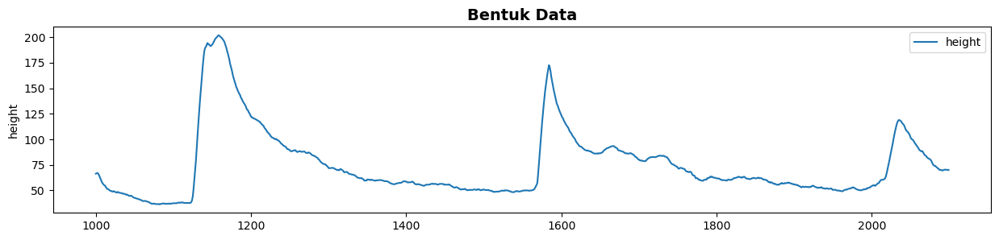

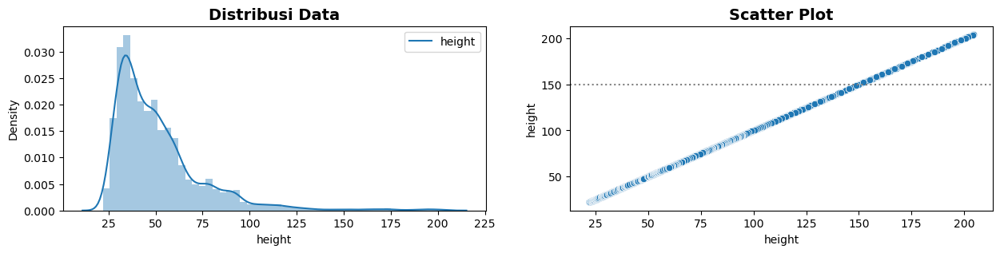

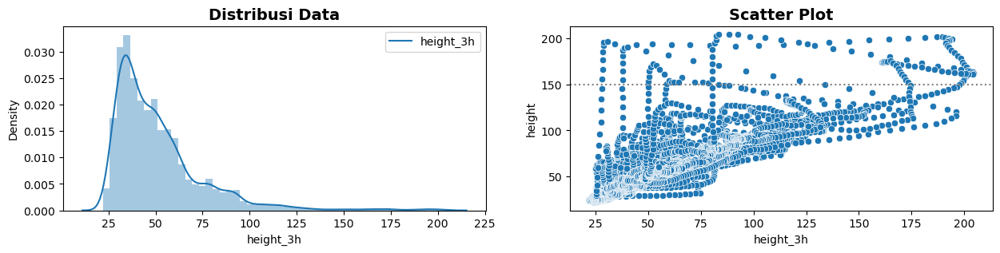

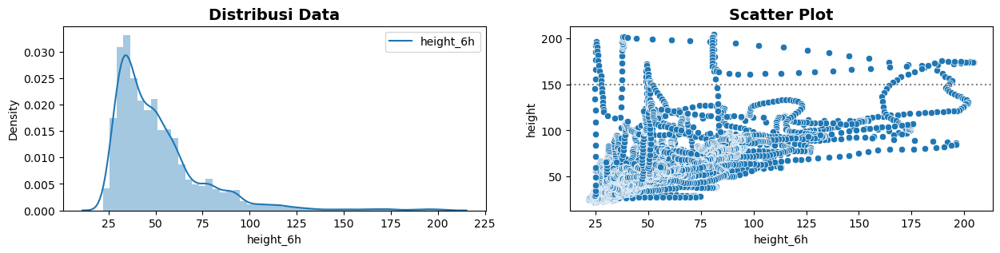

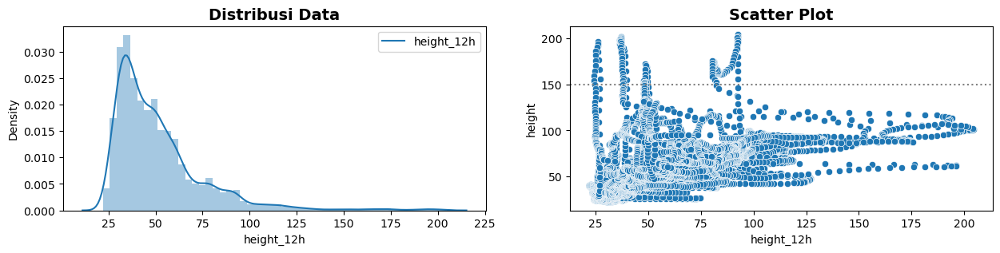

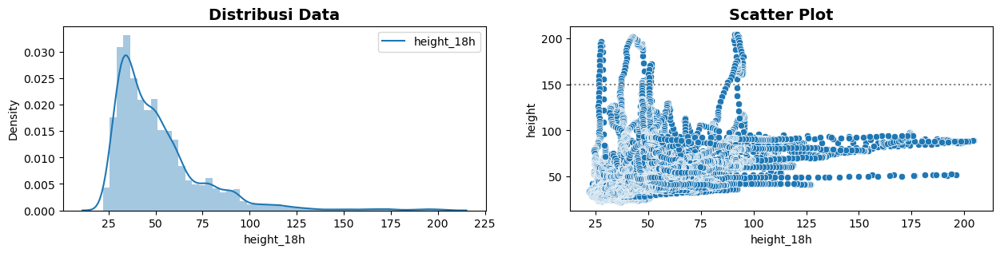

Persentase height  : 1.0077742585660812 %
Persentase lag 3h : 94.4284480276418 %
Persentase lag 6h : 99.15059026778002 %
Persentase lag 12h: 93.98214799884825 %
Persentase lag 18h: 92.67204146271236 %


,count,mean,std,min,25%,50%,75%,max
height,140.0,176.832214,15.970155,150.57,164.1100,174.070,192.3500,204.42
height_3h,140.0,128.178857,61.322035,28.07,68.6850,155.240,187.9850,204.42
height_6h,140.0,92.290857,60.336405,24.88,37.9950,80.365,148.6325,204.42
height_12h,140.0,58.491071,25.021919,24.34,36.9275,48.475,82.6600,92.67
height_18h,140.0,63.449286,26.289877,26.36,41.6675,50.155,92.3350,95.03


In [10]:
c='height'
plot_eda_grafik(col=c)
plot_eda_dist_scatter(col=c)
plot_eda_dist_scatter(col=c+'_3h')
plot_eda_dist_scatter(col=c+'_6h')
plot_eda_dist_scatter(col=c+'_12h')
plot_eda_dist_scatter(col=c+'_18h')
col_info_lag(c)

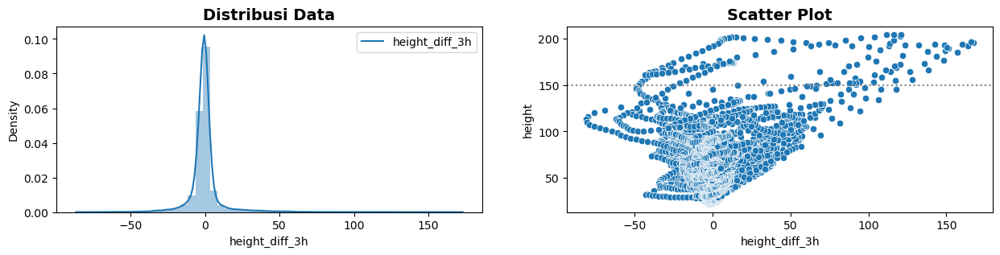

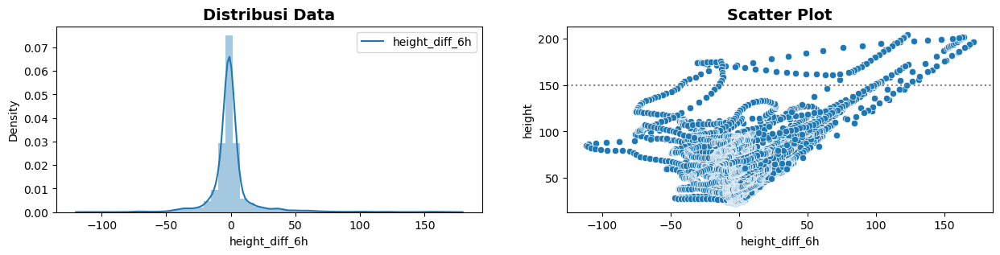

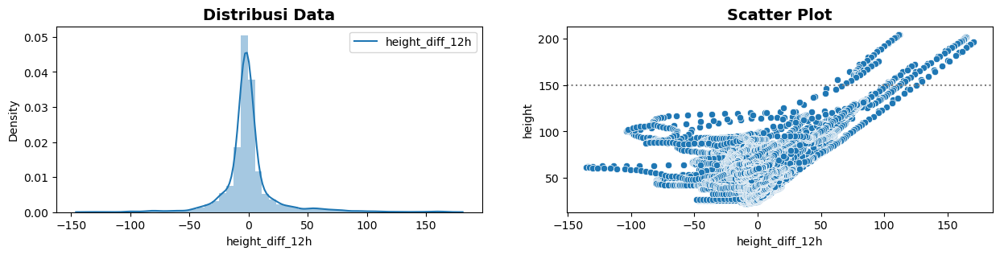

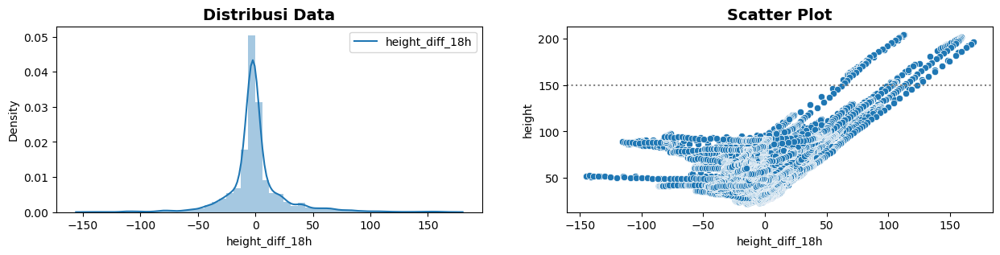

Persentase diff 3h : 99.7336596602361 %
Persentase diff 6h : 98.76907572703715 %
Persentase diff 12h: 2.548229196659948 %
Persentase diff 18h: 2.713792110567233 %


,count,mean,std,min,25%,50%,75%,max
height_diff_3h,140.0,48.653357,64.225422,-47.19,-5.7000,33.900,107.4975,167.19
height_diff_6h,140.0,84.541357,67.075965,-41.80,22.6375,103.775,142.1500,171.17
height_diff_12h,140.0,118.341143,31.182967,63.11,92.1925,111.610,151.9650,170.44
height_diff_18h,140.0,113.382929,32.205285,63.52,81.5750,111.305,146.2500,168.84


In [11]:
c='height'
plot_eda_dist_scatter(col=c+'_diff_3h')
plot_eda_dist_scatter(col=c+'_diff_6h')
plot_eda_dist_scatter(col=c+'_diff_12h')
plot_eda_dist_scatter(col=c+'_diff_18h')
col_info_diff(c)

#### **.dew (°C)**

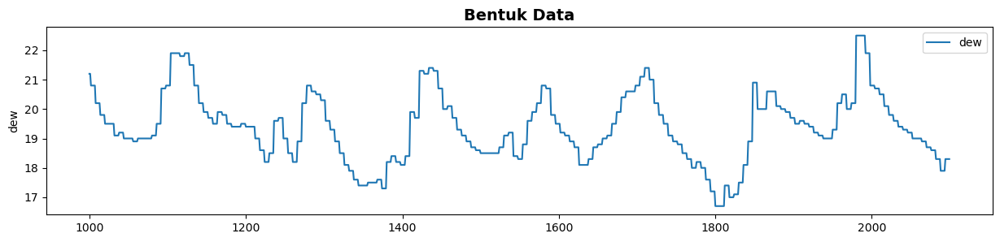

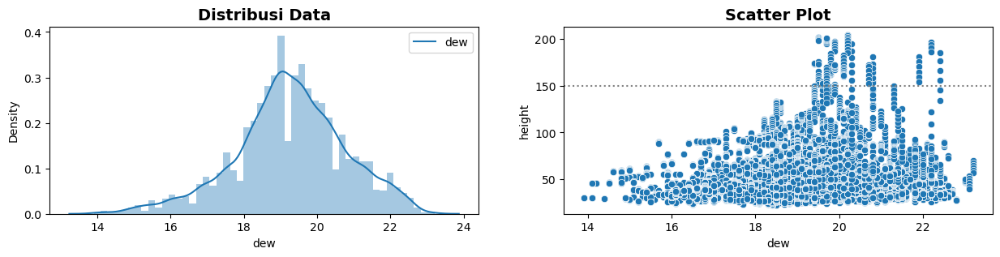

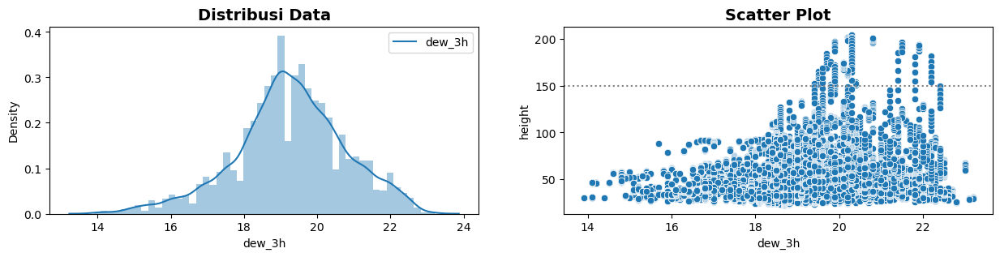

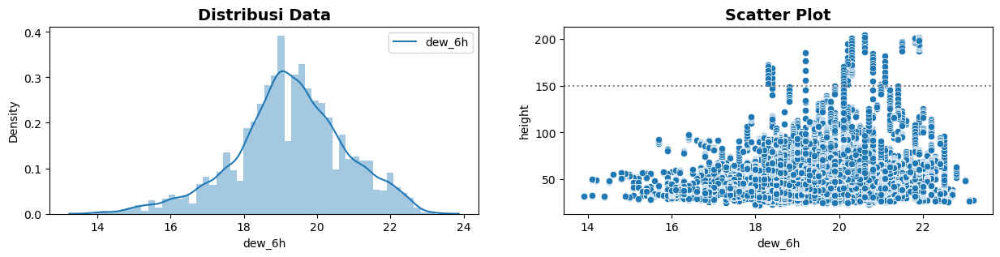

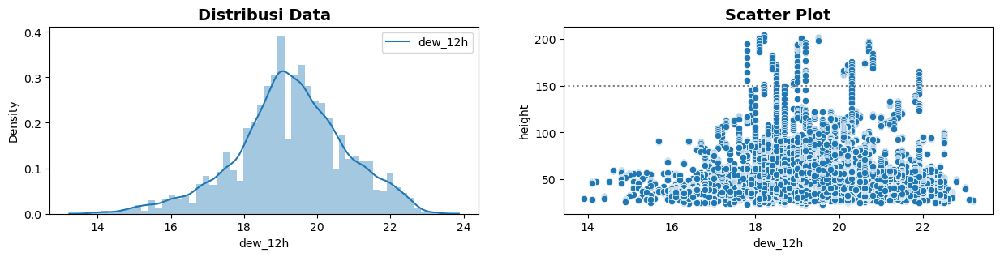

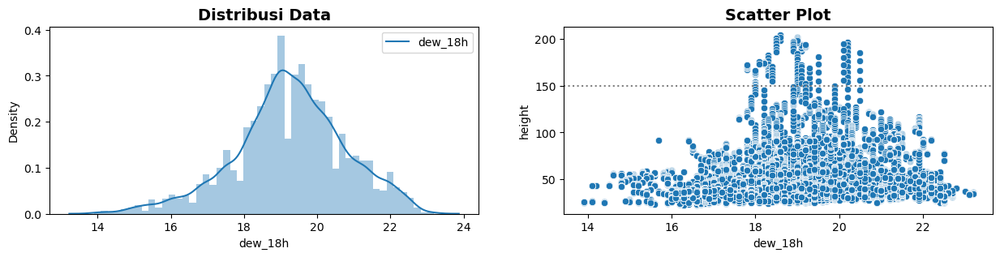

Persentase dew  : 46.94788367405701 %
Persentase lag 3h : 46.08407716671466 %
Persentase lag 6h : 74.690469334869 %
Persentase lag 12h: 81.86006334581054 %
Persentase lag 18h: 66.57068816585084 %


,count,mean,std,min,25%,50%,75%,max
dew,140.0,20.201429,0.790955,19.4,19.7,19.9,20.3,22.4
dew_3h,140.0,20.460000,0.759477,19.4,19.9,20.2,20.8,22.2
dew_6h,140.0,20.557857,0.907449,18.3,20.2,20.3,21.1,21.9
dew_12h,140.0,19.415000,1.008091,17.8,18.8,19.2,20.3,21.9
dew_18h,140.0,18.888571,0.731912,17.8,18.3,19.0,19.2,20.5


In [12]:
c='dew'
plot_eda_grafik(col=c)
plot_eda_dist_scatter(col=c)
plot_eda_dist_scatter(col=c+'_3h')
plot_eda_dist_scatter(col=c+'_6h')
plot_eda_dist_scatter(col=c+'_12h')
plot_eda_dist_scatter(col=c+'_18h')
col_info_lag(c)

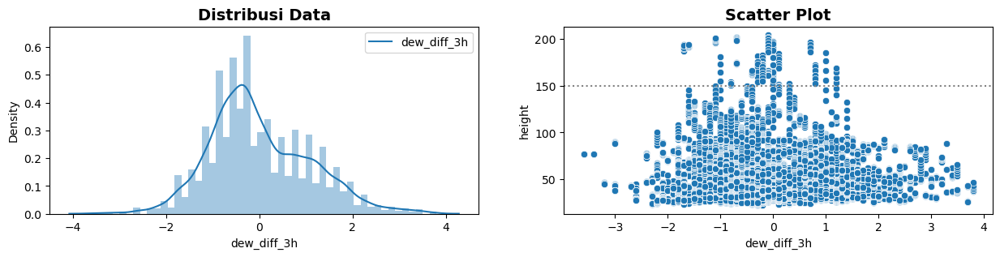

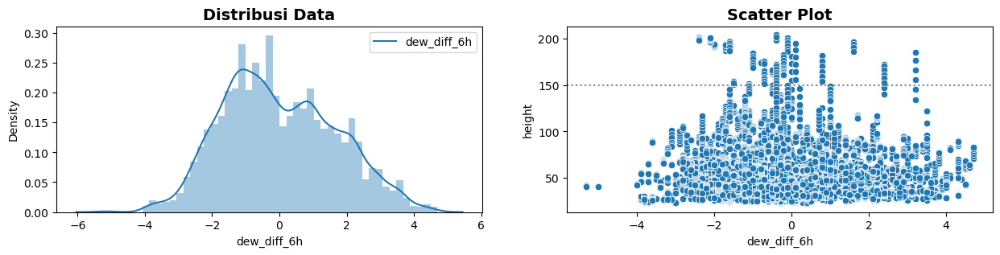

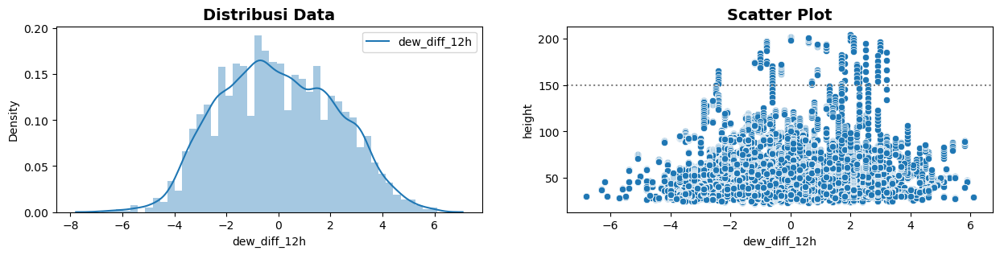

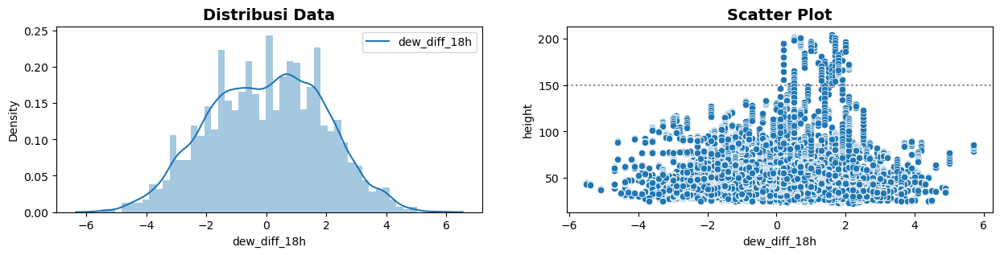

Persentase diff 3h : 81.60092139360783 %
Persentase diff 6h : 91.18917362510798 %
Persentase diff 12h: 77.06593723006047 %
Persentase diff 18h: 34.5090699683271 %


,count,mean,std,min,25%,50%,75%,max
dew_diff_3h,140.0,-0.258571,0.678338,-1.7,-0.7,-0.2,0.000,1.2
dew_diff_6h,140.0,-0.356429,1.349831,-2.4,-1.5,-0.4,0.000,3.2
dew_diff_12h,140.0,0.786429,1.503292,-2.4,-0.6,0.9,2.100,3.2
dew_diff_18h,140.0,1.312857,0.530080,0.2,0.8,1.4,1.725,2.1


In [13]:
c='dew'
plot_eda_dist_scatter(col=c+'_diff_3h')
plot_eda_dist_scatter(col=c+'_diff_6h')
plot_eda_dist_scatter(col=c+'_diff_12h')
plot_eda_dist_scatter(col=c+'_diff_18h')
col_info_diff(c)

#### **.humidity (%)**

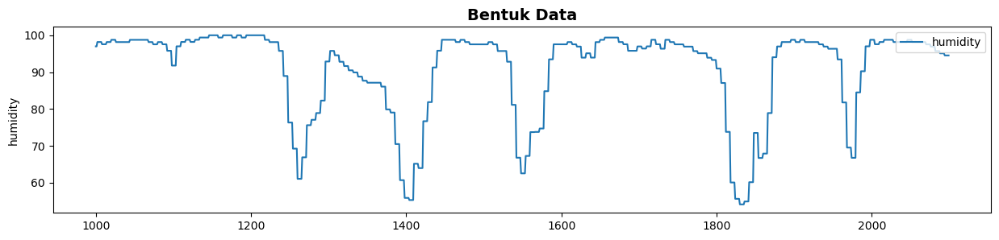

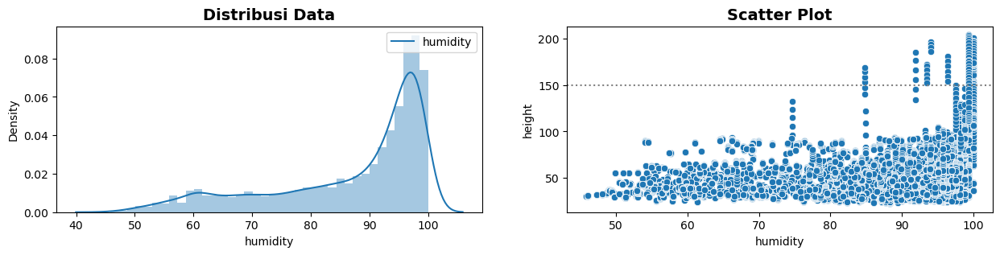

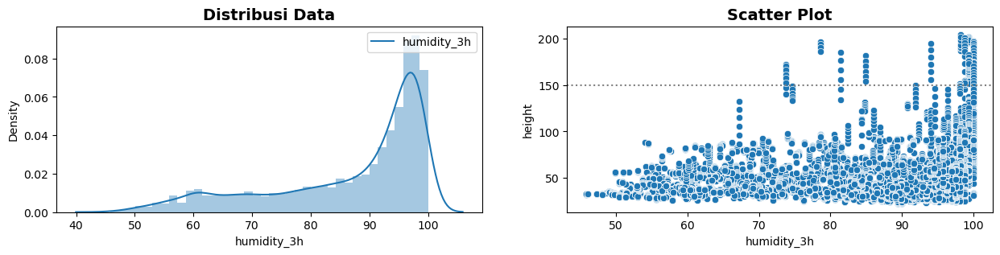

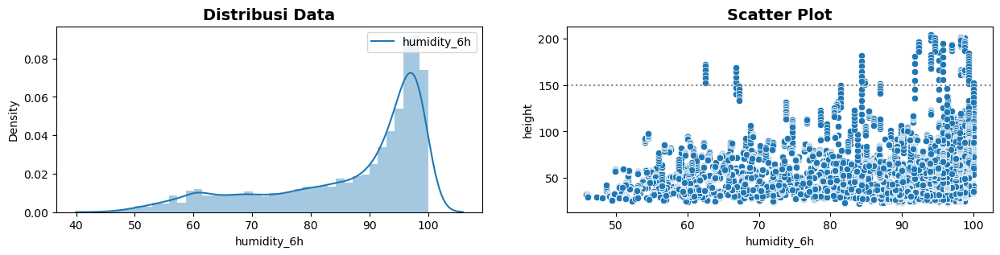

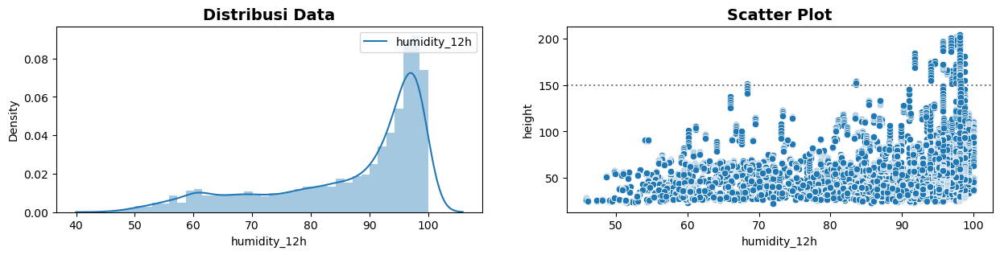

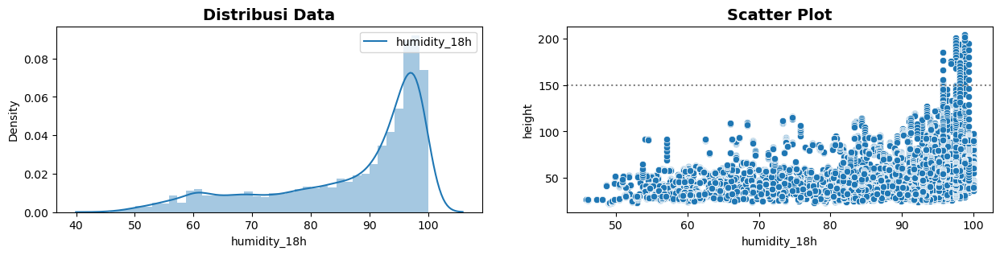

Persentase humidity  : 67.78001727613014 %
Persentase lag 3h : 80.99625683846818 %
Persentase lag 6h : 91.05960264900662 %
Persentase lag 12h: 77.49784048373164 %
Persentase lag 18h: 35.502447451770806 %


,count,mean,std,min,25%,50%,75%,max
humidity,140.0,98.360857,3.144444,84.83,99.3800,99.38,100.00,100.00
humidity_3h,140.0,95.202571,8.252113,73.73,98.1700,99.38,99.38,100.00
humidity_6h,140.0,93.729000,9.260984,62.54,94.0300,98.17,99.38,100.00
humidity_12h,140.0,96.091143,3.976052,68.37,95.7700,97.54,98.15,98.76
humidity_18h,140.0,98.026500,0.848243,95.70,97.9875,98.15,98.76,99.38


In [14]:
c='humidity'
plot_eda_grafik(col=c)
plot_eda_dist_scatter(col=c)
plot_eda_dist_scatter(col=c+'_3h')
plot_eda_dist_scatter(col=c+'_6h')
plot_eda_dist_scatter(col=c+'_12h')
plot_eda_dist_scatter(col=c+'_18h')
col_info_lag(c)

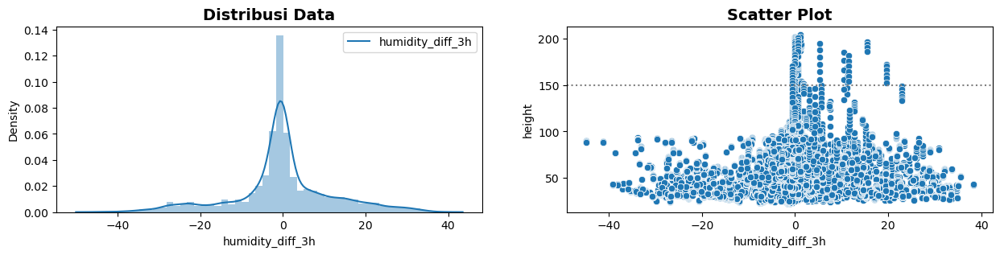

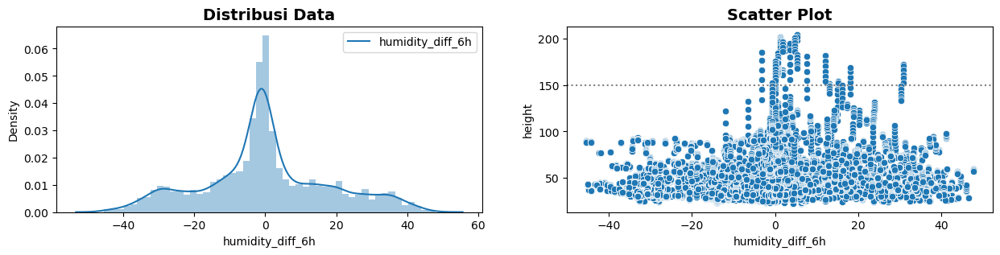

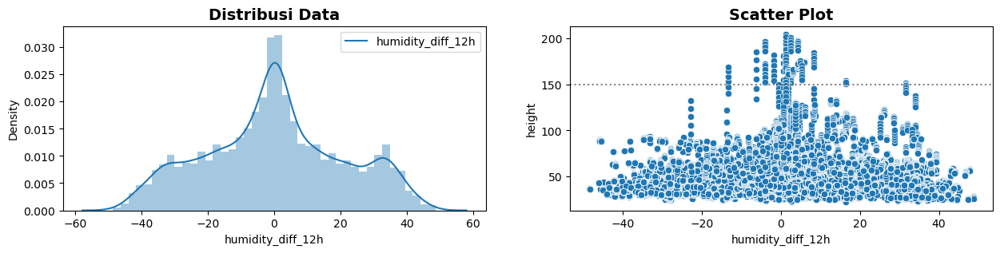

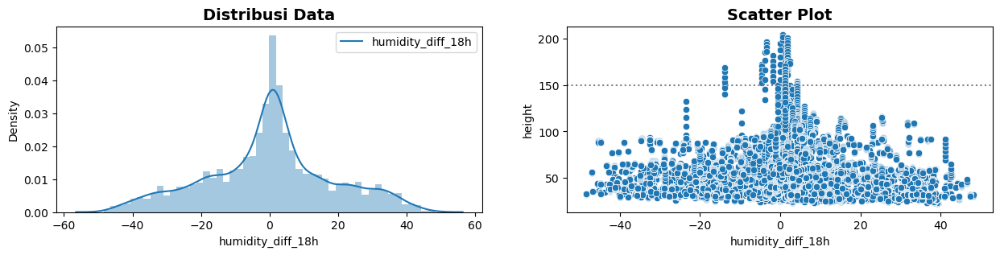

Persentase diff 3h : 50.66225165562914 %
Persentase diff 6h : 56.88165850849409 %
Persentase diff 12h: 64.79988482579903 %
Persentase diff 18h: 44.241289951050966 %


,count,mean,std,min,25%,50%,75%,max
humidity_diff_3h,140.0,3.158286,5.574438,-0.62,0.0000,0.61,1.23,19.69
humidity_diff_6h,140.0,4.631857,7.305082,-3.27,0.6175,1.78,5.34,30.93
humidity_diff_12h,140.0,2.269714,5.611590,-13.31,1.2300,1.85,4.23,31.63
humidity_diff_18h,140.0,0.334357,3.184289,-13.93,0.6200,1.24,1.85,4.30


In [15]:
c='humidity'
plot_eda_dist_scatter(col=c+'_diff_3h')
plot_eda_dist_scatter(col=c+'_diff_6h')
plot_eda_dist_scatter(col=c+'_diff_12h')
plot_eda_dist_scatter(col=c+'_diff_18h')
col_info_diff(c)

#### **.precip (mm)**

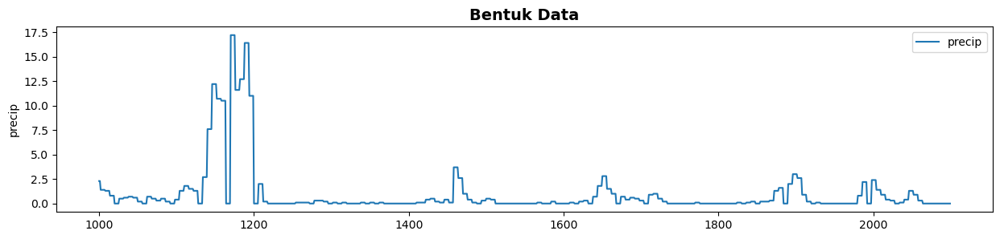

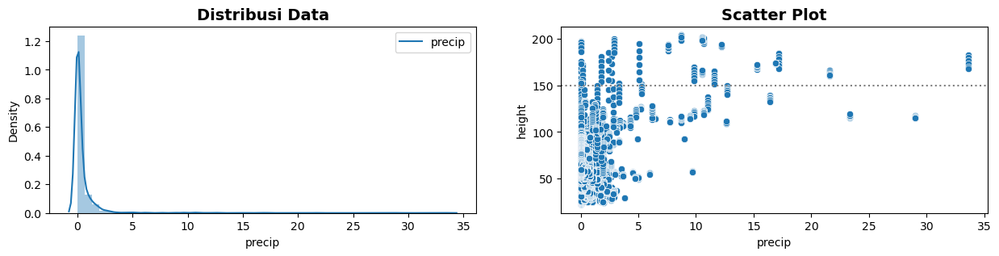

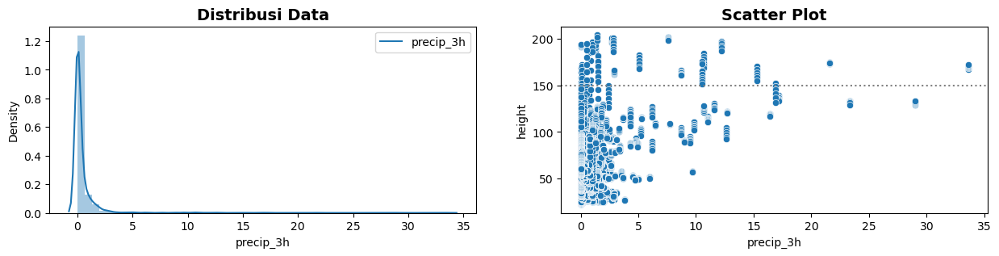

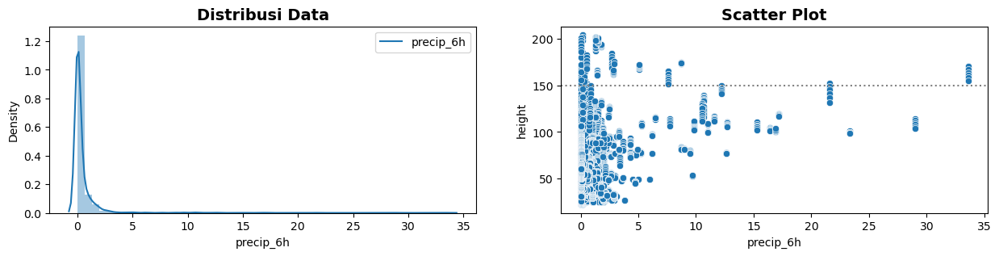

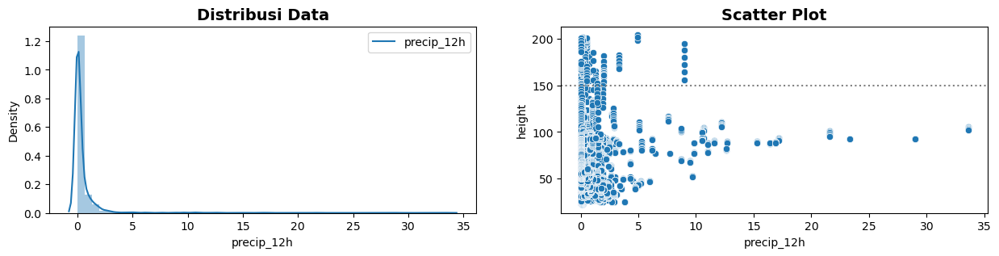

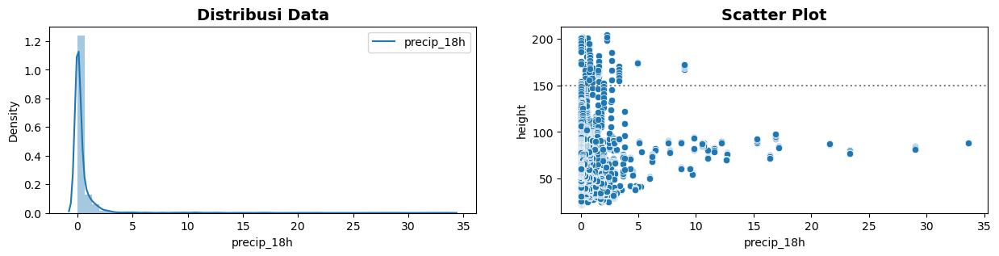

Persentase precip  : 100.0 %
Persentase lag 3h : 100.0 %
Persentase lag 6h : 100.0 %
Persentase lag 12h: 99.04981284192341 %
Persentase lag 18h: 99.04981284192341 %


,count,mean,std,min,25%,50%,75%,max
precip,140.0,8.615714,8.257870,0.0,1.8,8.7,12.200,33.6
precip_3h,140.0,6.651429,8.104013,0.0,1.0,2.8,10.500,33.6
precip_6h,140.0,3.248571,7.060524,0.0,0.0,1.3,2.800,33.6
precip_12h,140.0,1.157143,2.046585,0.0,0.0,0.4,1.300,9.0
precip_18h,140.0,1.390000,2.001521,0.0,0.2,0.7,1.525,9.0


In [16]:
c='precip'
plot_eda_grafik(col=c)
plot_eda_dist_scatter(col=c)
plot_eda_dist_scatter(col=c+'_3h')
plot_eda_dist_scatter(col=c+'_6h')
plot_eda_dist_scatter(col=c+'_12h')
plot_eda_dist_scatter(col=c+'_18h')
col_info_lag(c)

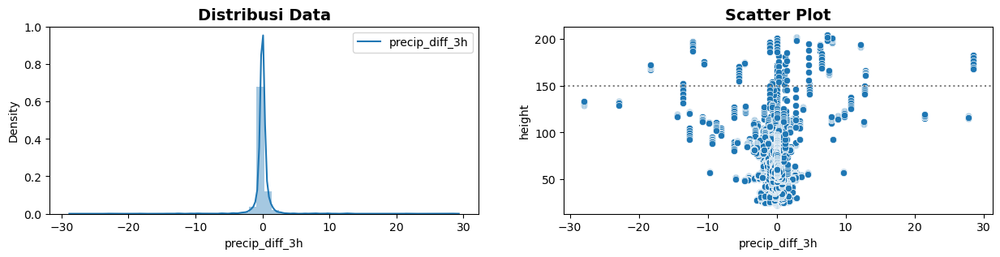

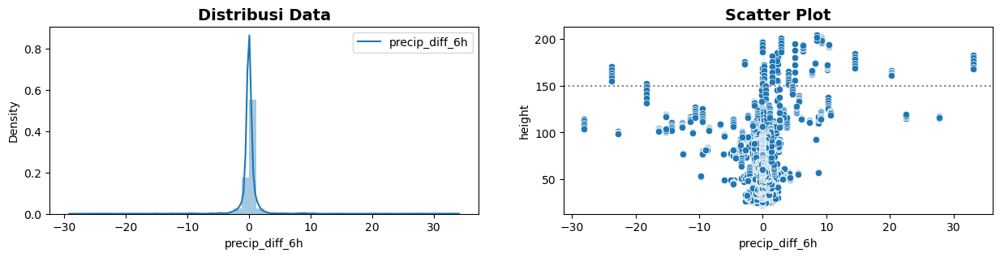

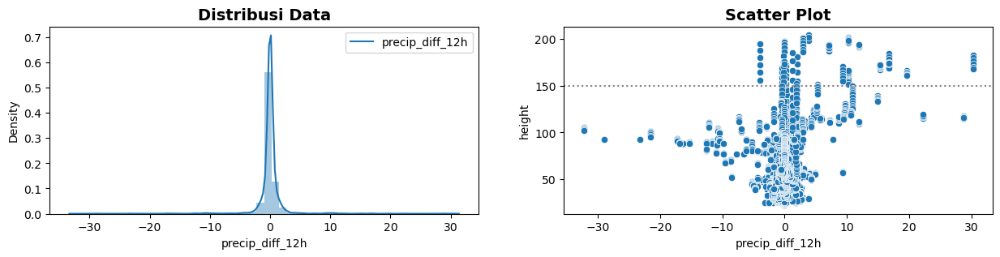

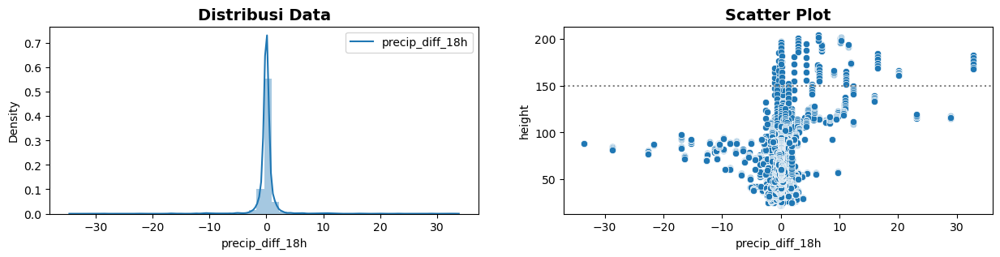

Persentase diff 3h : 99.91361934926577 %
Persentase diff 6h : 99.95680967463288 %
Persentase diff 12h: 98.31557731068241 %
Persentase diff 18h: 92.35531241002015 %


,count,mean,std,min,25%,50%,75%,max
precip_diff_3h,140.0,1.964286,9.315309,-18.3,-1.00,1.1,7.3,28.5
precip_diff_6h,140.0,5.367143,10.083496,-23.8,0.15,5.1,9.2,33.1
precip_diff_12h,140.0,7.458571,8.173232,-3.9,0.00,7.1,11.9,30.3
precip_diff_18h,140.0,7.225714,7.859571,-1.0,0.00,6.4,11.1,32.8


In [17]:
c='precip'
plot_eda_dist_scatter(col=c+'_diff_3h')
plot_eda_dist_scatter(col=c+'_diff_6h')
plot_eda_dist_scatter(col=c+'_diff_12h')
plot_eda_dist_scatter(col=c+'_diff_18h')
col_info_diff(c)

#### **.windgust (kph)**

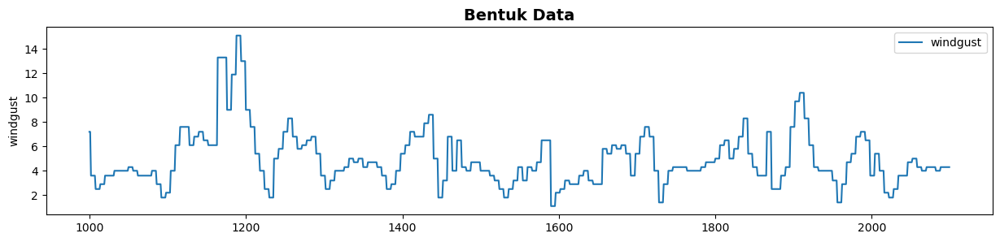

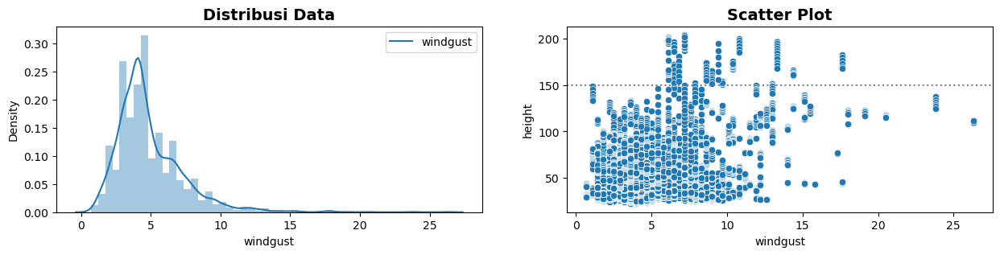

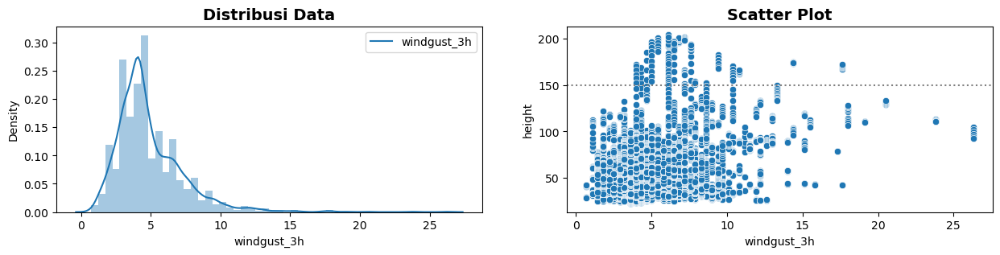

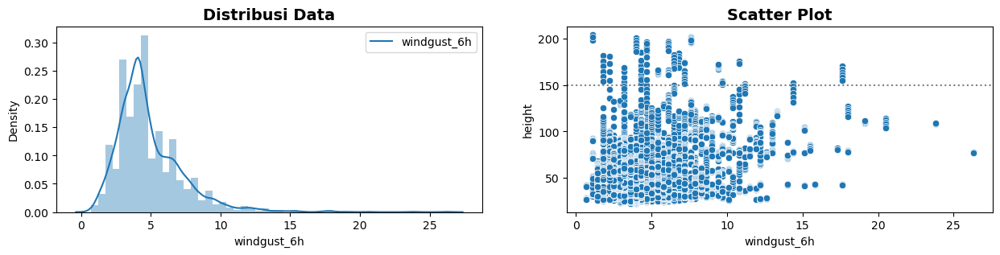

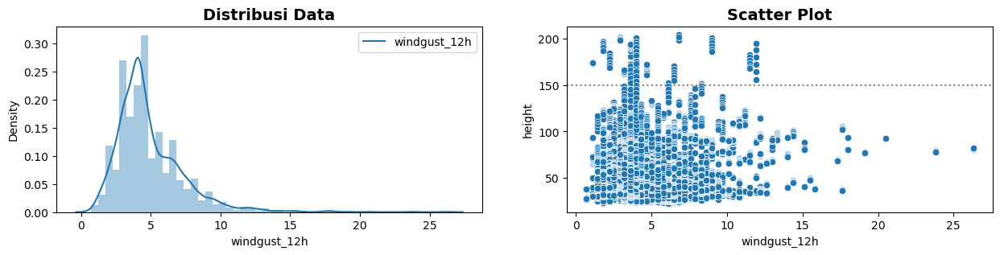

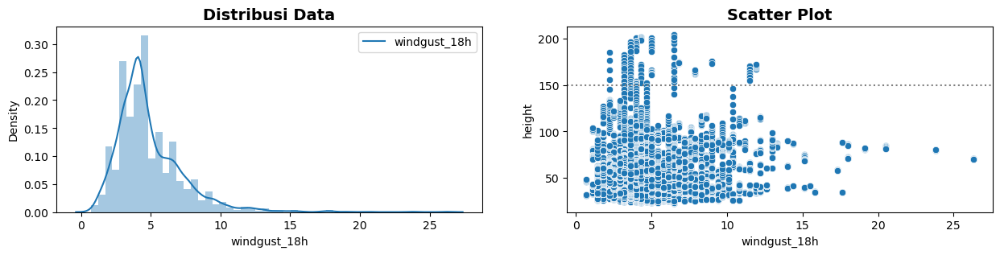

Persentase windgust  : 25.17995968902966 %
Persentase lag 3h : 65.05902677800172 %
Persentase lag 6h : 99.61128707169594 %
Persentase lag 12h: 98.22919665994817 %
Persentase lag 18h: 93.72300604664555 %


,count,mean,std,min,25%,50%,75%,max
windgust,140.0,9.039286,3.077154,6.1,6.5,8.6,10.4,17.6
windgust_3h,140.0,7.538571,3.127313,4.0,6.1,6.5,7.9,17.6
windgust_6h,140.0,6.404286,3.459631,1.1,4.3,6.1,7.6,17.6
windgust_12h,140.0,4.767143,2.690844,1.1,3.6,4.0,4.7,11.9
windgust_18h,140.0,5.380714,2.503376,2.2,3.6,4.3,6.5,11.9


In [18]:
c='windgust'
plot_eda_grafik(col=c)
plot_eda_dist_scatter(col=c)
plot_eda_dist_scatter(col=c+'_3h')
plot_eda_dist_scatter(col=c+'_6h')
plot_eda_dist_scatter(col=c+'_12h')
plot_eda_dist_scatter(col=c+'_18h')
col_info_lag(c)

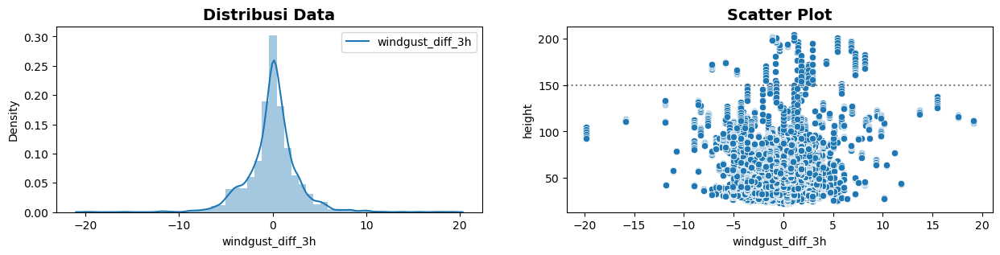

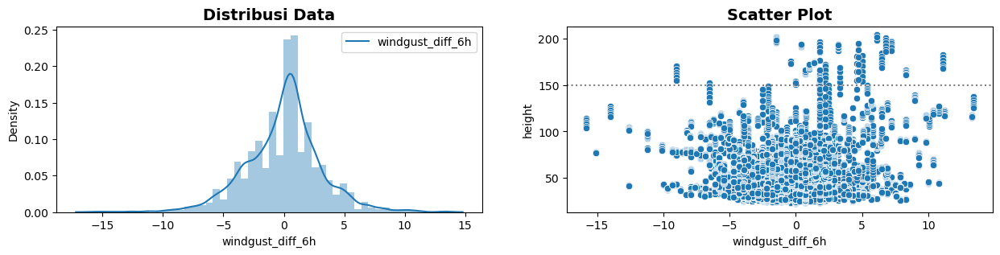

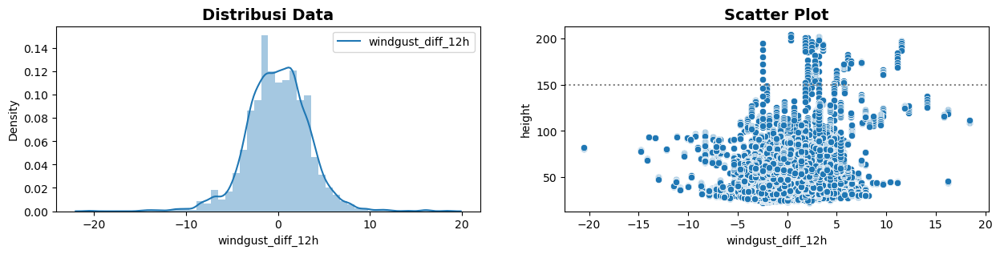

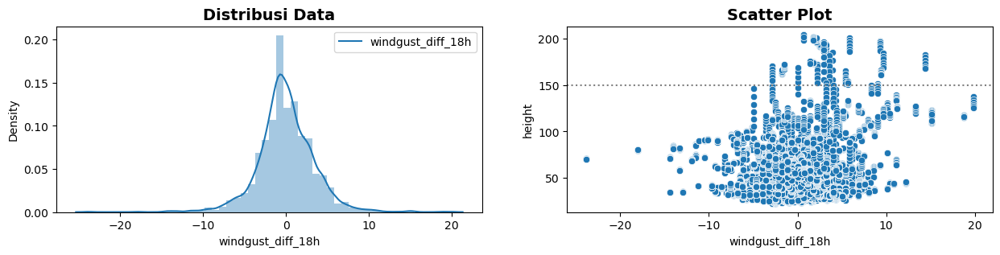

Persentase diff 3h : 98.40195796141664 %
Persentase diff 6h : 99.265764468759 %
Persentase diff 12h: 80.00287935502448 %
Persentase diff 18h: 86.69737978692773 %


,count,mean,std,min,25%,50%,75%,max
windgust_diff_3h,140.0,1.500714,3.989636,-7.2,-0.7,1.8,4.3,8.2
windgust_diff_6h,140.0,2.635000,4.137874,-9.0,0.4,1.8,6.1,11.1
windgust_diff_12h,140.0,4.272143,3.266795,-2.5,2.4,3.2,6.1,11.5
windgust_diff_18h,140.0,3.658571,3.995285,-2.9,1.8,2.9,5.7,14.4


In [19]:
c='windgust'
plot_eda_dist_scatter(col=c+'_diff_3h')
plot_eda_dist_scatter(col=c+'_diff_6h')
plot_eda_dist_scatter(col=c+'_diff_12h')
plot_eda_dist_scatter(col=c+'_diff_18h')
col_info_diff(c)

#### **.sealevelpressure (mbar)**

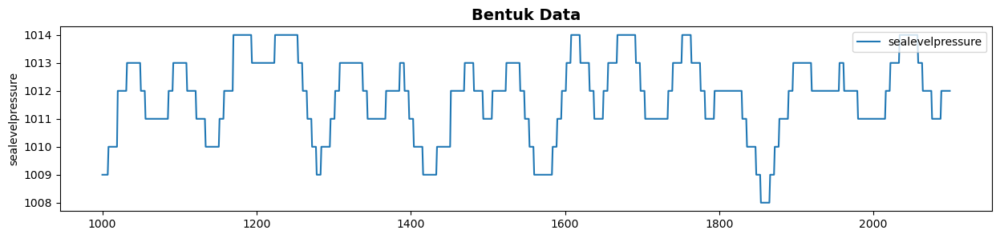

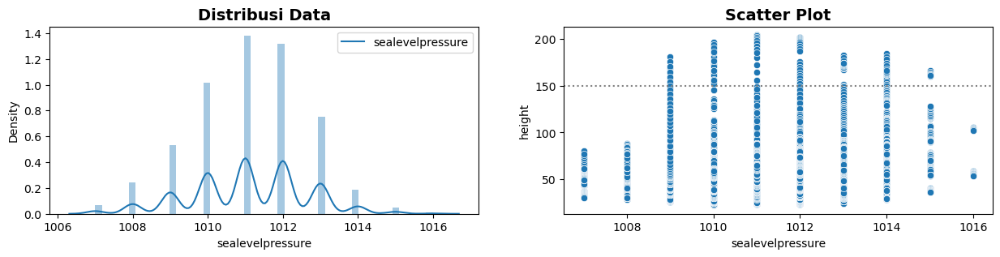

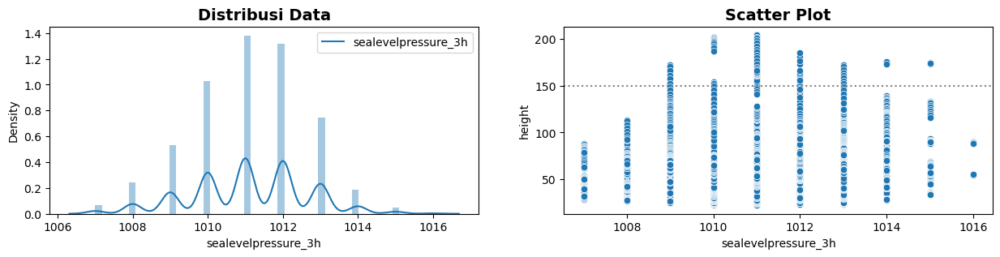

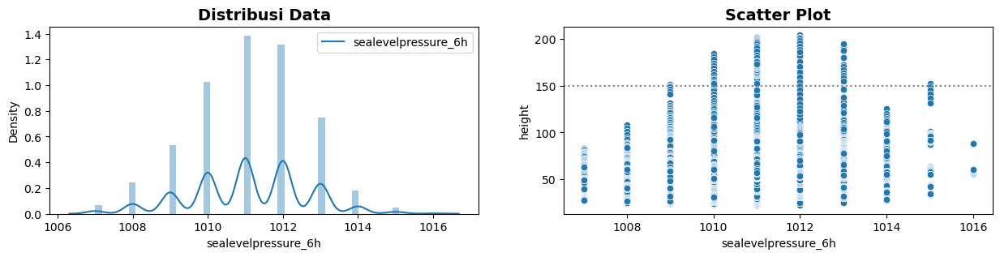

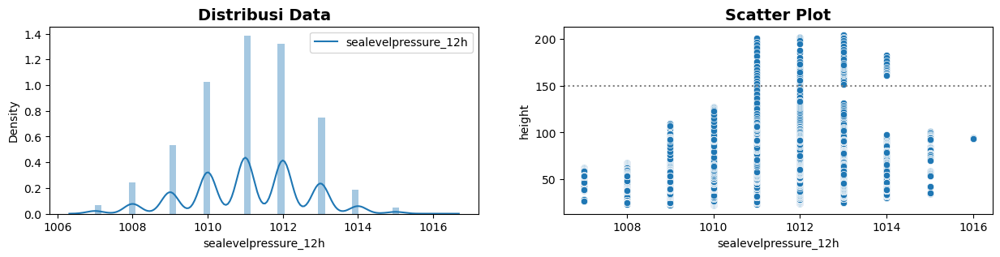

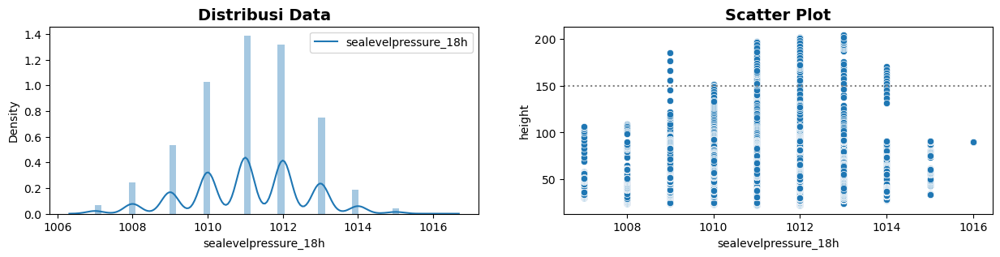

Persentase sealevelpressure  : 94.25568672617334 %
Persentase lag 3h : 94.25568672617334 %
Persentase lag 6h : 94.28448027641808 %
Persentase lag 12h: 65.53412035704002 %
Persentase lag 18h: 93.59343507054419 %


,count,mean,std,min,25%,50%,75%,max
sealevelpressure,140.0,1011.678571,1.637105,1009.0,1010.0,1012.0,1013.0,1015.0
sealevelpressure_3h,140.0,1011.271429,1.392905,1009.0,1011.0,1011.0,1012.0,1015.0
sealevelpressure_6h,140.0,1011.514286,0.978074,1009.0,1011.0,1011.0,1012.0,1015.0
sealevelpressure_12h,140.0,1012.178571,0.954112,1011.0,1011.0,1012.0,1013.0,1014.0
sealevelpressure_18h,140.0,1012.028571,1.059000,1009.0,1011.0,1012.0,1013.0,1014.0


In [20]:
c='sealevelpressure'
plot_eda_grafik(col=c)
plot_eda_dist_scatter(col=c)
plot_eda_dist_scatter(col=c+'_3h')
plot_eda_dist_scatter(col=c+'_6h')
plot_eda_dist_scatter(col=c+'_12h')
plot_eda_dist_scatter(col=c+'_18h')
col_info_lag(c)

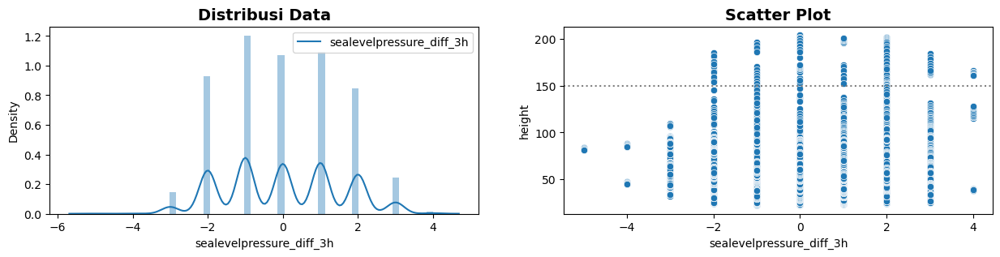

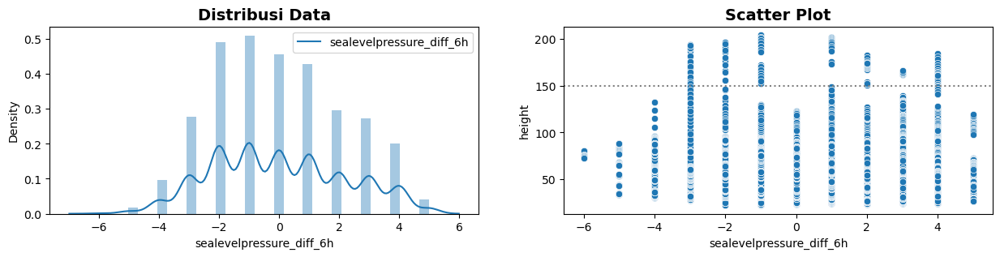

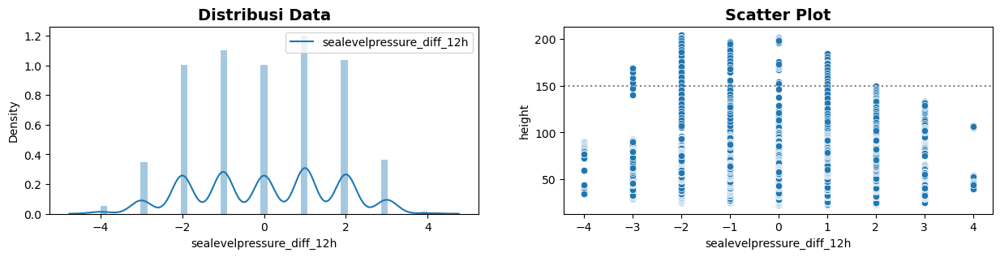

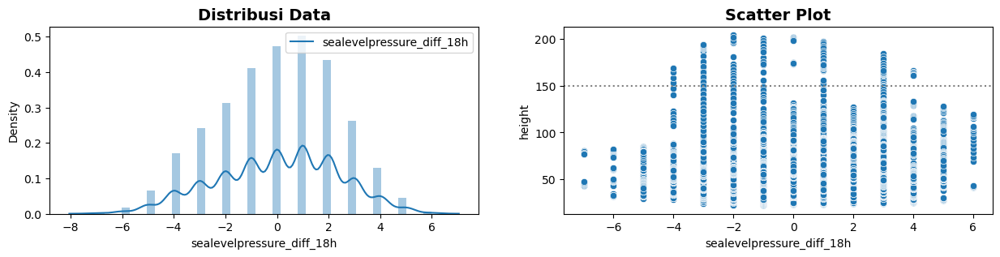

Persentase diff 3h : 97.23581917650446 %
Persentase diff 6h : 94.86035128131299 %
Persentase diff 12h: 76.07255974661675 %
Persentase diff 18h: 95.50820616181976 %


,count,mean,std,min,25%,50%,75%,max
sealevelpressure_diff_3h,140.0,0.407143,1.790850,-2.0,-1.0,0.0,2.0,4.0
sealevelpressure_diff_6h,140.0,0.164286,2.361595,-3.0,-2.0,-1.0,2.0,4.0
sealevelpressure_diff_12h,140.0,-0.500000,1.172220,-3.0,-1.0,-1.0,1.0,1.0
sealevelpressure_diff_18h,140.0,-0.350000,2.201781,-4.0,-2.0,-1.0,1.0,4.0


In [21]:
c='sealevelpressure'
plot_eda_dist_scatter(col=c+'_diff_3h')
plot_eda_dist_scatter(col=c+'_diff_6h')
plot_eda_dist_scatter(col=c+'_diff_12h')
plot_eda_dist_scatter(col=c+'_diff_18h')
col_info_diff(c)

#### **.cloudcover (%)**

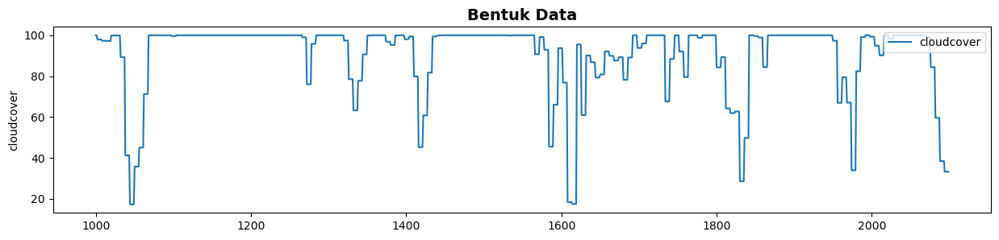

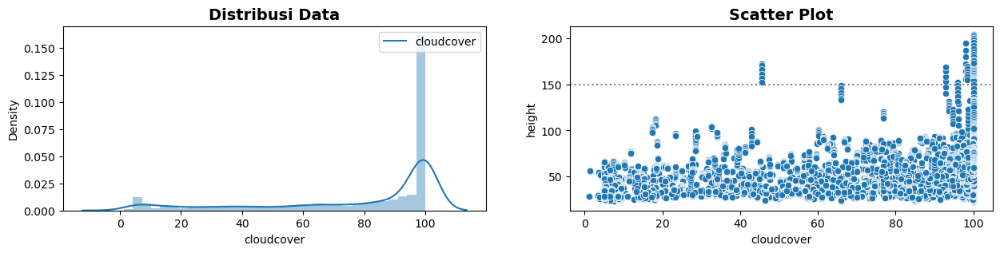

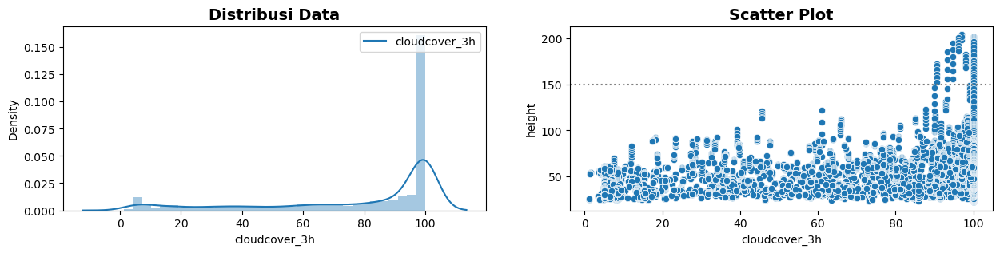

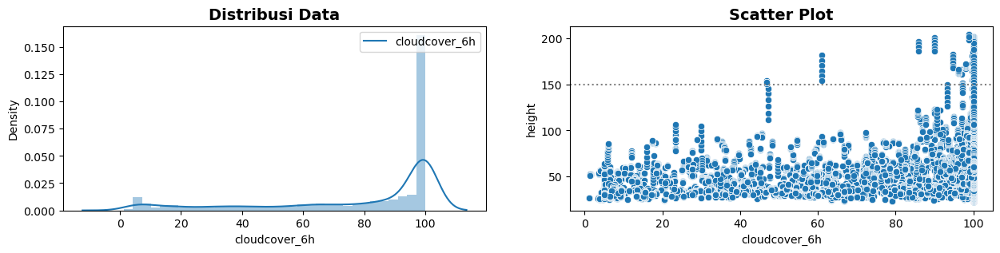

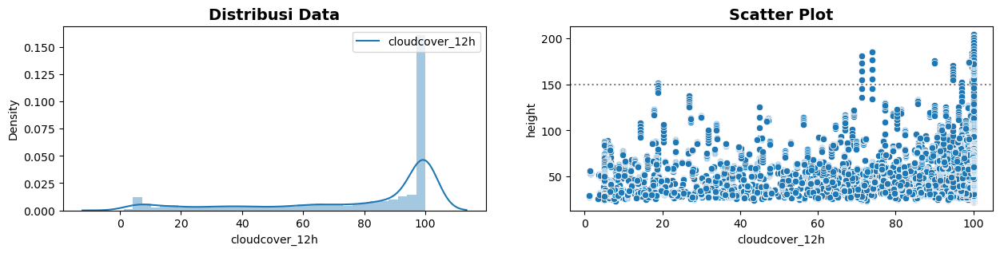

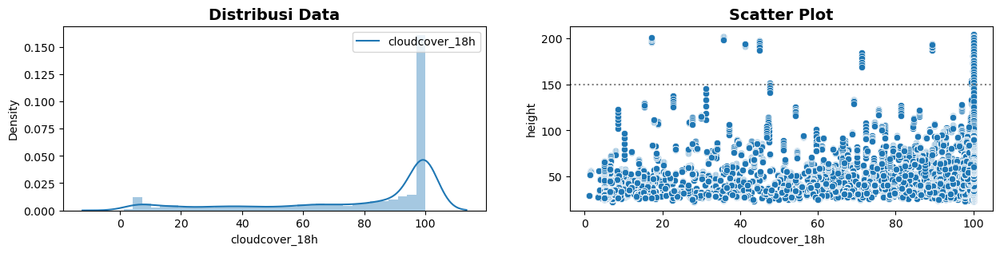

Persentase cloudcover  : 81.90325367117765 %
Persentase lag 3h : 56.809674632882235 %
Persentase lag 6h : 81.42816009213935 %
Persentase lag 12h: 90.88684134753815 %
Persentase lag 18h: 91.92340915634898 %


,count,mean,std,min,25%,50%,75%,max
cloudcover,140.0,97.282857,11.073021,45.5,100.0,100.0,100.0,100.0
cloudcover_3h,140.0,98.798571,2.457729,90.7,100.0,100.0,100.0,100.0
cloudcover_6h,140.0,94.325000,13.062711,46.9,96.1,100.0,100.0,100.0
cloudcover_12h,140.0,97.097857,9.374851,18.9,99.7,100.0,100.0,100.0
cloudcover_18h,140.0,86.723571,25.241395,17.2,89.3,100.0,100.0,100.0


In [22]:
c='cloudcover'
plot_eda_grafik(col=c)
plot_eda_dist_scatter(col=c)
plot_eda_dist_scatter(col=c+'_3h')
plot_eda_dist_scatter(col=c+'_6h')
plot_eda_dist_scatter(col=c+'_12h')
plot_eda_dist_scatter(col=c+'_18h')
col_info_lag(c)

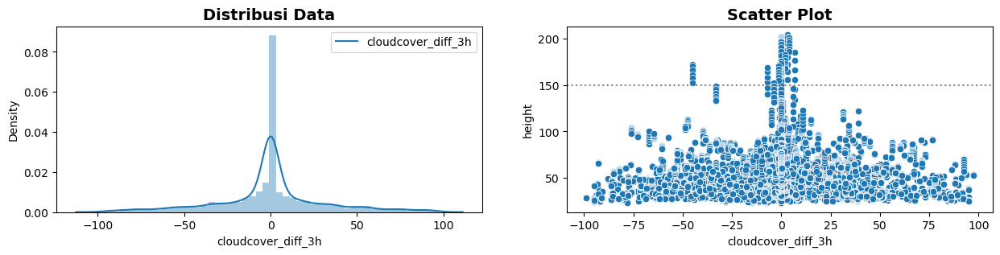

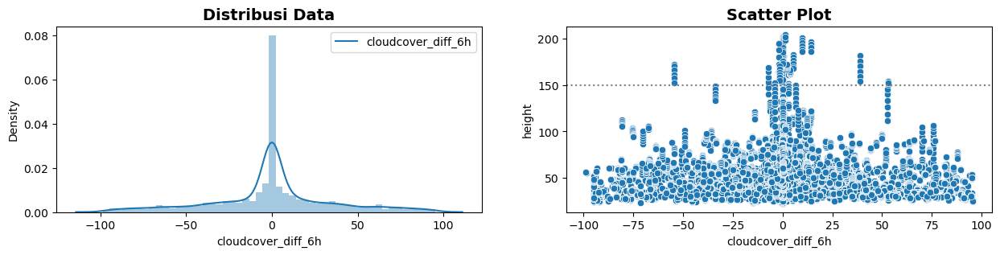

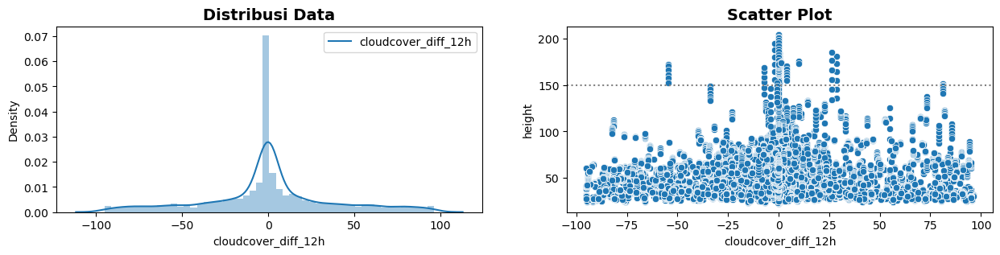

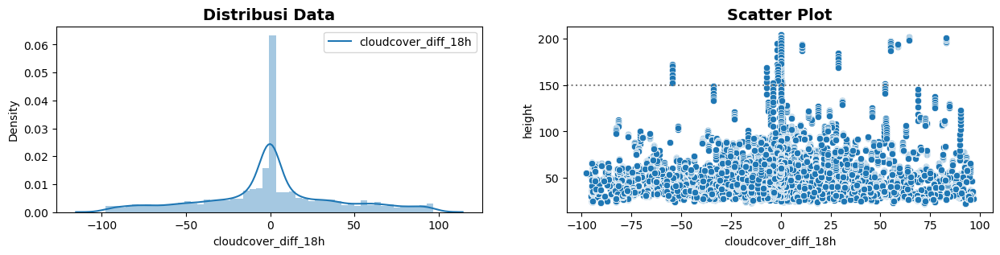

Persentase diff 3h : 65.40454938093868 %
Persentase diff 6h : 84.14915059026778 %
Persentase diff 12h: 87.64756694500431 %
Persentase diff 18h: 86.91333141376332 %


,count,mean,std,min,25%,50%,75%,max
cloudcover_diff_3h,140.0,-1.515714,9.516100,-45.2,0.0,0.0,0.0,6.8
cloudcover_diff_6h,140.0,2.957857,18.008543,-54.5,0.0,0.0,3.9,53.1
cloudcover_diff_12h,140.0,0.185000,15.017495,-54.5,0.0,0.0,0.3,81.1
cloudcover_diff_18h,140.0,10.559286,28.851460,-54.5,0.0,0.0,10.7,82.8


In [23]:
c='cloudcover'
plot_eda_dist_scatter(col=c+'_diff_3h')
plot_eda_dist_scatter(col=c+'_diff_6h')
plot_eda_dist_scatter(col=c+'_diff_12h')
plot_eda_dist_scatter(col=c+'_diff_18h')
col_info_diff(c)

#### **.visibility (km)**

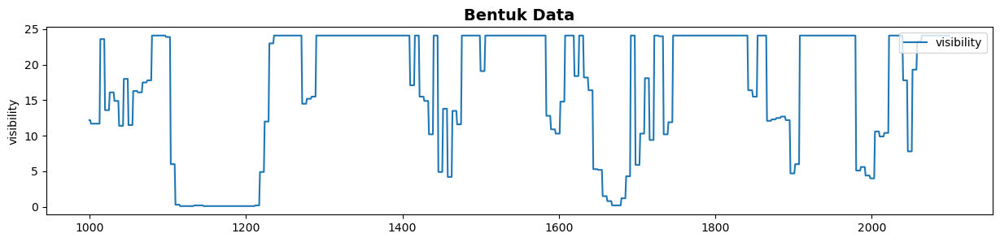

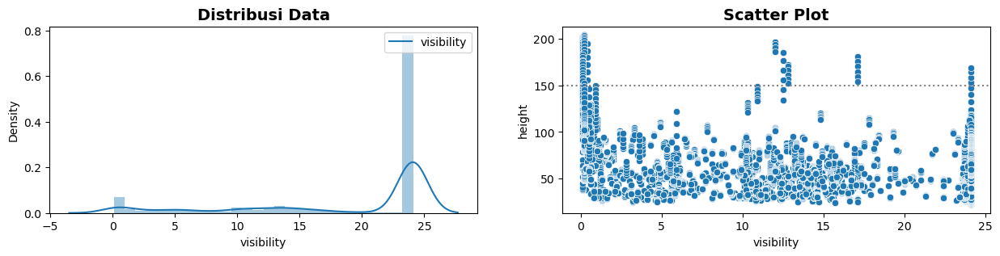

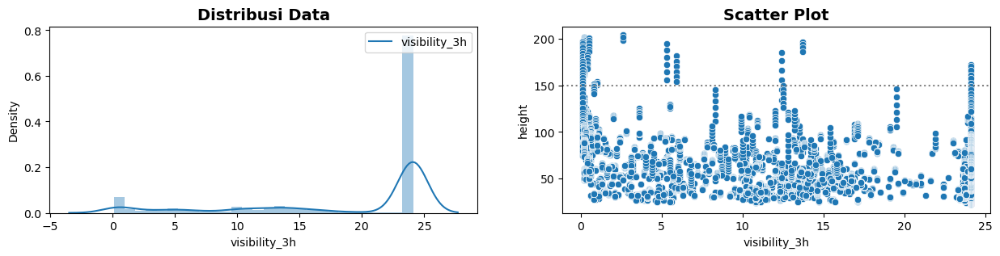

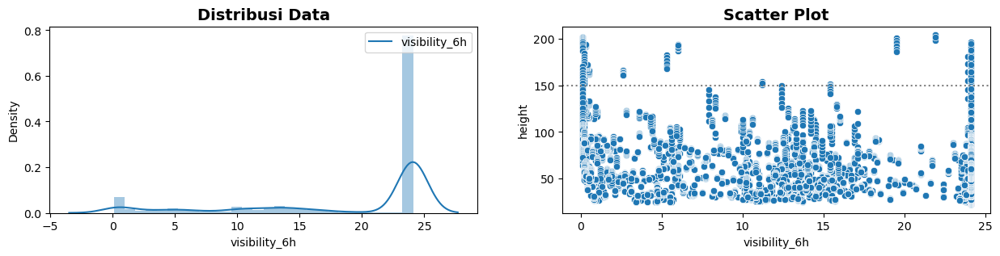

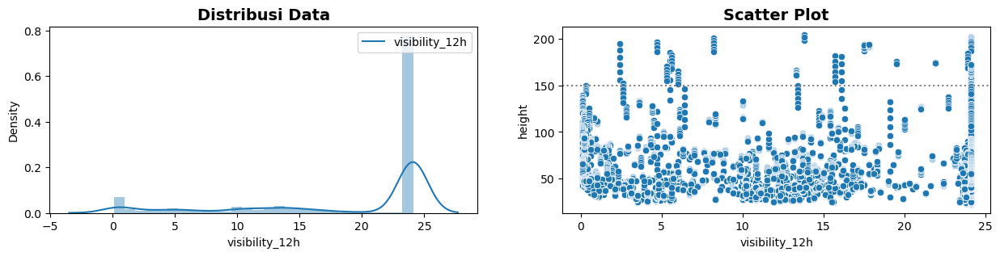

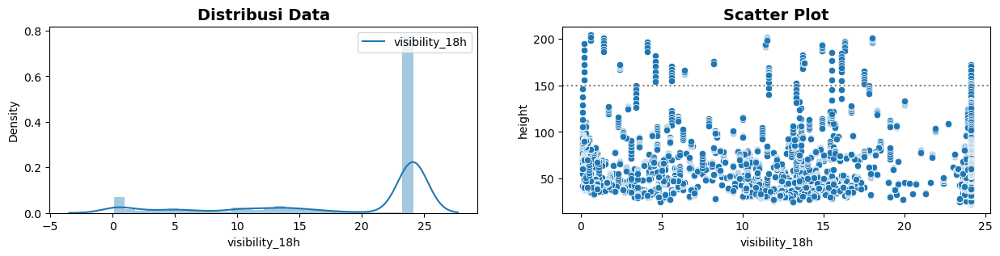

Persentase visibility  : 100.0 %
Persentase lag 3h : 100.0 %
Persentase lag 6h : 100.0 %
Persentase lag 12h: 91.96659948171609 %
Persentase lag 18h: 98.01324503311258 %


,count,mean,std,min,25%,50%,75%,max
visibility,140.0,2.952143,6.193725,0.1,0.10,0.1,0.2,24.1
visibility_3h,140.0,3.417857,6.754932,0.1,0.10,0.2,2.6,24.1
visibility_6h,140.0,9.255000,10.545321,0.1,0.20,2.6,23.9,24.1
visibility_12h,140.0,16.252143,7.881902,2.4,7.65,17.8,24.1,24.1
visibility_18h,140.0,11.208571,6.943383,0.2,4.60,11.6,16.1,24.1


In [24]:
c='visibility'
plot_eda_grafik(col=c)
plot_eda_dist_scatter(col=c)
plot_eda_dist_scatter(col=c+'_3h')
plot_eda_dist_scatter(col=c+'_6h')
plot_eda_dist_scatter(col=c+'_12h')
plot_eda_dist_scatter(col=c+'_18h')
col_info_lag(c)

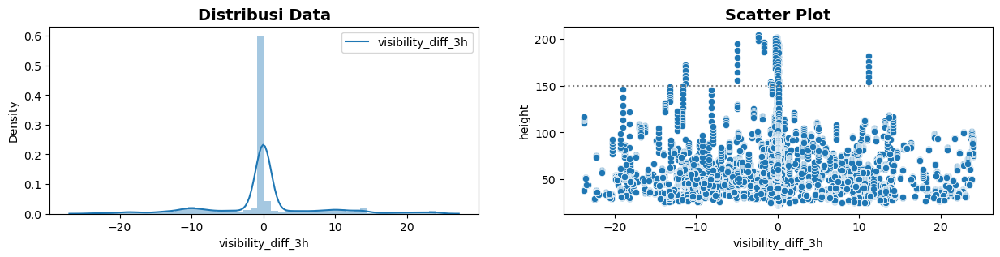

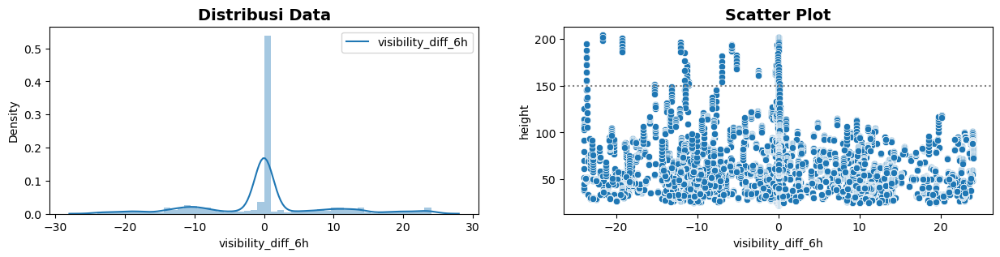

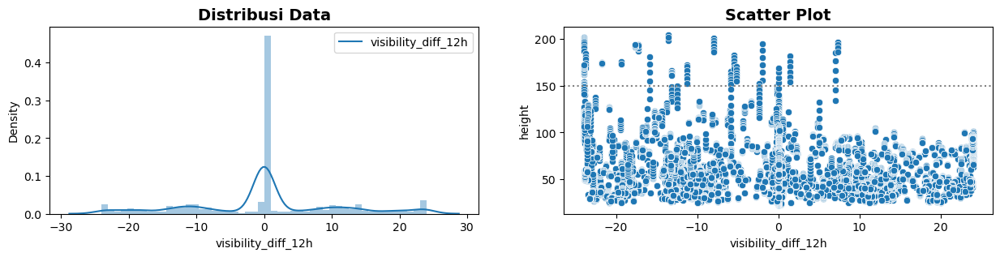

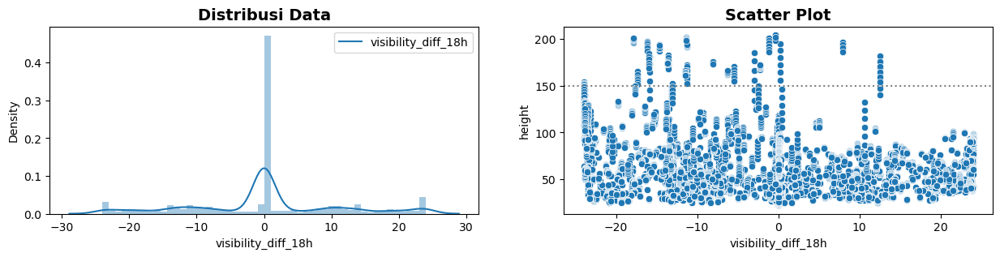

Persentase diff 3h : 86.48142816009215 %
Persentase diff 6h : 75.94298877051541 %
Persentase diff 12h: 78.5200115174201 %
Persentase diff 18h: 86.74057011229485 %


,count,mean,std,min,25%,50%,75%,max
visibility_diff_3h,140.0,-0.465714,3.488105,-11.3,-0.3,0.0,0.0,11.2
visibility_diff_6h,140.0,-6.302857,8.032891,-23.7,-11.3,-0.4,-0.1,0.1
visibility_diff_12h,140.0,-13.300000,10.092222,-24.0,-24.0,-15.9,-5.5,7.3
visibility_diff_18h,140.0,-8.256429,9.286303,-24.0,-15.0,-11.3,-2.3,12.5


In [25]:
c='visibility'
plot_eda_dist_scatter(col=c+'_diff_3h')
plot_eda_dist_scatter(col=c+'_diff_6h')
plot_eda_dist_scatter(col=c+'_diff_12h')
plot_eda_dist_scatter(col=c+'_diff_18h')
col_info_diff(c)

**Kesimpulan:**

- Dari analisis di atas, dipilih beberapa fitur dengan persentase < 70%
- Dari fitur yang terpilih masih ada beberapa yang distribusiya tidak normal, dalam beberapa kasus bentuk distribusi dapat memengaruhi model dalam menangkap pola data, jadi sebaiknya data dalam bentuk normal

### Cek Korelasi (2)

<AxesSubplot: >

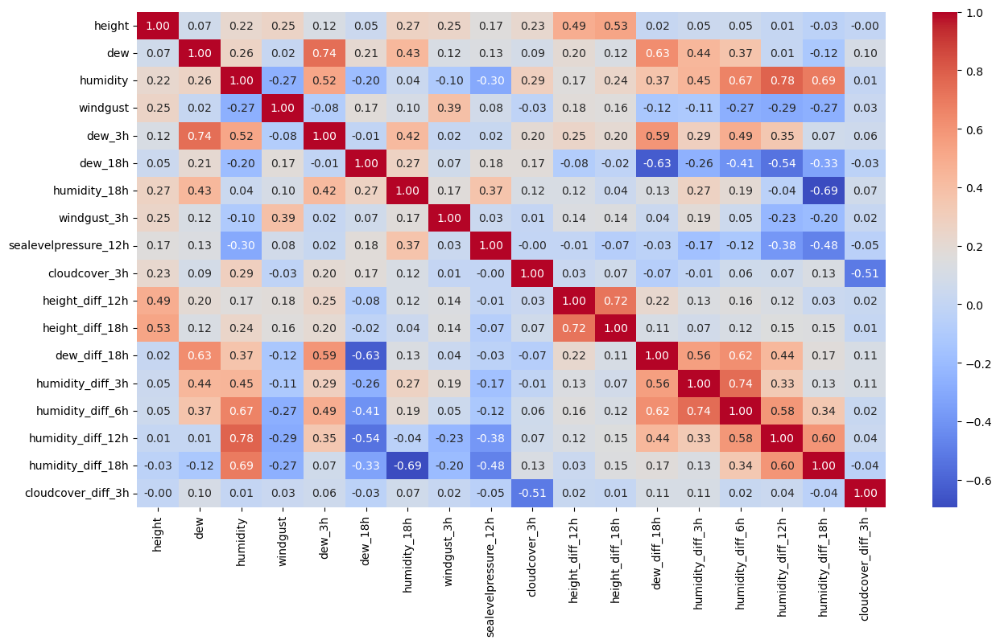

In [26]:
NUMS=data[['height','dew','humidity','windgust',
           'dew_3h','dew_18h','humidity_18h','windgust_3h','sealevelpressure_12h','cloudcover_3h', 
           'height_diff_12h','height_diff_18h','dew_diff_18h','humidity_diff_3h','humidity_diff_6h','humidity_diff_12h','humidity_diff_18h','cloudcover_diff_3h']]

plt.figure(figsize=(15,8))
sns.heatmap(NUMS.corr(), annot=True, cmap='coolwarm', fmt='.2f')
#plt.savefig('corr.png')

Memilih fitur yang tidak redundan, korelasi antar fitur < 0.5 dan korelasi dengan target > 0.2

<AxesSubplot: >

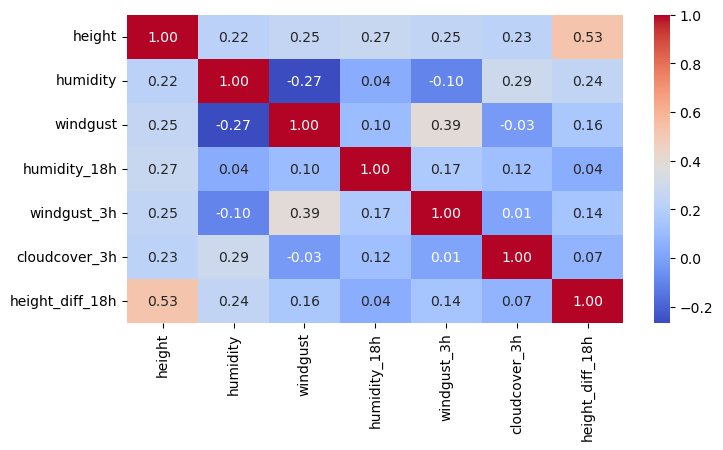

In [27]:
NUMS=data[['height','humidity','windgust',
           'humidity_18h','windgust_3h','cloudcover_3h', 
           'height_diff_18h']]

plt.figure(figsize=(8,4))
sns.heatmap(NUMS.corr(), annot=True, cmap='coolwarm', fmt='.2f')
#plt.savefig('corr.png')

- 'humidity' dan'humidity_18h'memiliki sebaran data yang mirip,begitupun dengan 'windgust'dan'windgust_3h'. jadi diplih salah satu

## - DATA PREPROCESSING

### Feature Selection

In [28]:
# Membagi fitur/prediktor dan label 
X = data[['height','windgust','cloudcover_3h','humidity_18h','height_diff_18h']]
y = data[['height']]

In [29]:
X.head()

,height,windgust,cloudcover_3h,humidity_18h,height_diff_18h
0,42.24,2.9,64.3,93.32,18.72
1,42.14,2.9,64.3,93.32,17.69
2,41.73,2.9,64.3,93.32,16.36
3,41.36,2.9,64.3,93.32,15.07
4,41.33,2.9,64.3,93.32,14.12


In [30]:
y.head()

,height
0,42.24
1,42.14
2,41.73
3,41.36
4,41.33


### Split Dataset

train | val | test 

70% | 15% | 15%

In [31]:
# split data train|val|test
train_end = int(len(X)*0.7)
val_end = int(len(X)*0.85)

X_train = X[:train_end] 
y_train = y[:train_end] 
X_val = X[train_end:val_end] 
y_val = y[train_end:val_end] 
X_test = X[val_end:] 
y_test = y[val_end:] 

X_train.shape, y_train.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape

((9724, 5), (9724, 1), (2084, 5), (2084, 1), (2084, 5), (2084, 1))

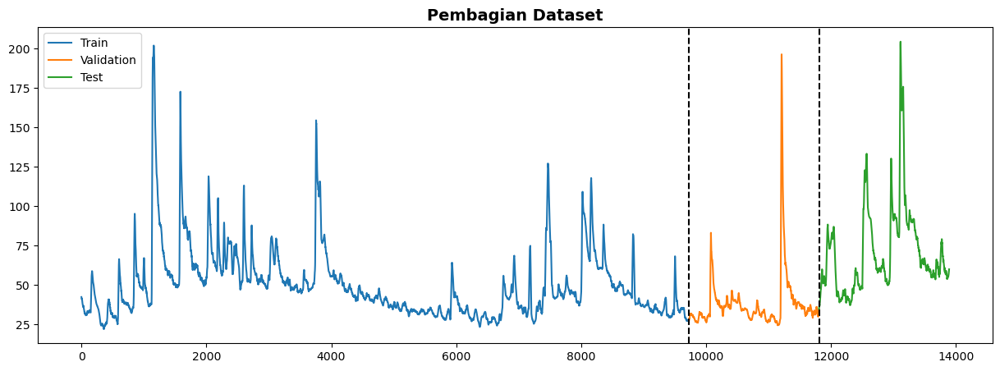

In [32]:
# bentuk pembagian data
plt.figure(figsize=(15, 5))
plt.plot(y_train)
plt.plot(y_val)
plt.plot(y_test)
plt.title('Pembagian Dataset', fontweight='bold',fontsize= 14)
plt.axvline(X_train.shape[0], color='black', linestyle='--')
plt.axvline(X_train.shape[0]+X_val.shape[0], color='black', linestyle='--')
plt.legend(['Train', 'Validation', 'Test'])

### Scaling

GRU bisa mengatasi data yang tidak terdistribusi normal, jadi hanya dilakukan scaling saja agar lebih mudah untuk mengevaluasi hasil prediksi model

In [33]:
# scaling/normalisasi data
'''
  fit hanya pada data train 
  agar tidak terjadi data leakage/kebocoran data
'''
# X
scaler_X = MinMaxScaler().fit(X_train)
X_train = scaler_X.transform(X_train)
X_val = scaler_X.transform(X_val)
X_test = scaler_X.transform(X_test)

# y
scaler_y = MinMaxScaler().fit(y_train)
y_train = scaler_y.transform(y_train)
y_val = scaler_y.transform(y_val)
y_test = scaler_y.transform(y_test)

# reshape 
y_train = y_train.reshape(-1)
y_val = y_val.reshape(-1)
y_test = y_test.reshape(-1)

In [34]:
X_train[:10]

array([[0.11256806, 0.0859375 , 0.63866397, 0.87661618, 0.48568503],
       [0.11201245, 0.0859375 , 0.63866397, 0.87661618, 0.4819189 ],
       [0.10973441, 0.0859375 , 0.63866397, 0.87661618, 0.47705583],
       [0.10767863, 0.0859375 , 0.63866397, 0.87661618, 0.47233903],
       [0.10751195, 0.0859375 , 0.63866397, 0.87661618, 0.46886541],
       [0.10695633, 0.0859375 , 0.63866397, 0.87661618, 0.46509927],
       [0.10545616, 0.05859375, 0.38967611, 0.85519025, 0.46074811],
       [0.10695633, 0.05859375, 0.38967611, 0.85519025, 0.45837142],
       [0.10601178, 0.05859375, 0.38967611, 0.85519025, 0.45380087],
       [0.10528948, 0.05859375, 0.38967611, 0.85519025, 0.447914  ]])

In [35]:
y_train[:10]

array([0.11256806, 0.11201245, 0.10973441, 0.10767863, 0.10751195,
       0.10695633, 0.10545616, 0.10695633, 0.10601178, 0.10528948])

**Save scaler:**

In [36]:
joblib.dump(scaler_X, 'scaler/scaler_A2/scaler_X_prediksi_flood-A2.save') 
joblib.dump(scaler_y, 'scaler/scaler_A2/scaler_y_prediksi_flood-A2.save') 

['scaler/scaler_A2/scaler_y_prediksi_flood-A2.save']

### Windowing

#### (1) 24 jam - 6 jam

In [37]:
# window (1)
window_size_1 = 144
future_size_1 = 36

X_train_window_1, y_train_window_1 = create_window(X_train, window_size_1, future_size_1, y_train)
X_val_window_1, y_val_window_1 = create_window(X_val, window_size_1, future_size_1, y_val)
X_test_window_1, y_test_window_1 = create_window(X_test, window_size_1, future_size_1, y_test)

print(X_train_window_1.shape, y_train_window_1.shape)
print(X_val_window_1.shape, y_val_window_1.shape)
print(X_test_window_1.shape, y_test_window_1.shape)

(9544, 144, 5) (9544, 36)
(1904, 144, 5) (1904, 36)
(1904, 144, 5) (1904, 36)


#### (2) 24 jam - 12 jam

In [38]:
# window (2)
window_size_2 = 144
future_size_2 = 72

X_train_window_2, y_train_window_2 = create_window(X_train, window_size_2, future_size_2, y_train)
X_val_window_2, y_val_window_2 = create_window(X_val, window_size_2, future_size_2, y_val)
X_test_window_2, y_test_window_2 = create_window(X_test, window_size_2, future_size_2, y_test)

print(X_train_window_2.shape, y_train_window_2.shape)
print(X_val_window_2.shape, y_val_window_2.shape)
print(X_test_window_2.shape, y_test_window_2.shape)

(9508, 144, 5) (9508, 72)
(1868, 144, 5) (1868, 72)
(1868, 144, 5) (1868, 72)


#### (3) 48 jam - 6 jam

In [39]:
# window (3)
window_size_3 = 288 #288
future_size_3 = 36

X_train_window_3, y_train_window_3 = create_window(X_train, window_size_3, future_size_3, y_train)
X_val_window_3, y_val_window_3 = create_window(X_val, window_size_3, future_size_3, y_val)
X_test_window_3, y_test_window_3 = create_window(X_test, window_size_3, future_size_3, y_test)

print(X_train_window_3.shape, y_train_window_3.shape)
print(X_val_window_3.shape, y_val_window_3.shape)
print(X_test_window_3.shape, y_test_window_3.shape)

(9400, 288, 5) (9400, 36)
(1760, 288, 5) (1760, 36)
(1760, 288, 5) (1760, 36)


#### (4) 48 jam - 12 jam

In [40]:
# window (4)
window_size_4 = 288
future_size_4 = 72

X_train_window_4, y_train_window_4 = create_window(X_train, window_size_4, future_size_4, y_train)
X_val_window_4, y_val_window_4 = create_window(X_val, window_size_4, future_size_4, y_val)
X_test_window_4, y_test_window_4 = create_window(X_test, window_size_4, future_size_4, y_test)

print(X_train_window_4.shape, y_train_window_4.shape)
print(X_val_window_4.shape, y_val_window_4.shape)
print(X_test_window_4.shape, y_test_window_4.shape)

(9364, 288, 5) (9364, 72)
(1724, 288, 5) (1724, 72)
(1724, 288, 5) (1724, 72)


## - MODELING & RESULT

In [41]:
EPOCHS=20
PATIENCE=20

### Model 1 (window-1)

In [42]:
# Membuat model GRU
model_1 = Sequential()
model_1.add(GRU(window_size_1, 
                input_shape=(window_size_1, X_train.shape[1]), 
                return_sequences=False))
model_1.add(Dense(future_size_1))
model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 144)               65232     
                                                                 
 dense (Dense)               (None, 36)                5220      
                                                                 
Total params: 70,452
Trainable params: 70,452
Non-trainable params: 0
_________________________________________________________________


In [43]:
model_1.compile(loss=tf.keras.losses.MeanSquaredError(), # MeanSquaredError
                optimizer=Adam(lr=0.0001), 
                metrics=[tf.keras.metrics.MeanAbsoluteError(),
                         tf.keras.metrics.RootMeanSquaredError()]) 

early_stopping = EarlyStopping(monitor='val_loss', 
                               patience=PATIENCE, 
                               verbose=1, 
                               restore_best_weights=True)

history_1 = model_1.fit(X_train_window_1, y_train_window_1, 
                        validation_data=(X_val_window_1, y_val_window_1),
                        epochs=EPOCHS, batch_size=32,
                        callbacks=[early_stopping])

Epoch 1/20
299/299 [==============================] - 11s 26ms/step - loss: 0.0164 - mean_absolute_error: 0.0871 - root_mean_squared_error: 0.1279 - val_loss: 0.0101 - val_mean_absolute_error: 0.0721 - val_root_mean_squared_error: 0.1003
Epoch 2/20
299/299 [==============================] - 8s 26ms/step - loss: 0.0061 - mean_absolute_error: 0.0459 - root_mean_squared_error: 0.0784 - val_loss: 0.0079 - val_mean_absolute_error: 0.0503 - val_root_mean_squared_error: 0.0888
Epoch 3/20
299/299 [==============================] - 7s 25ms/step - loss: 0.0050 - mean_absolute_error: 0.0369 - root_mean_squared_error: 0.0709 - val_loss: 0.0070 - val_mean_absolute_error: 0.0373 - val_root_mean_squared_error: 0.0834
Epoch 4/20
299/299 [==============================] - 8s 25ms/step - loss: 0.0046 - mean_absolute_error: 0.0337 - root_mean_squared_error: 0.0681 - val_loss: 0.0066 - val_mean_absolute_error: 0.0342 - val_root_mean_squared_error: 0.0812
Epoch 5/20
299/299 [==============================]

#### Result

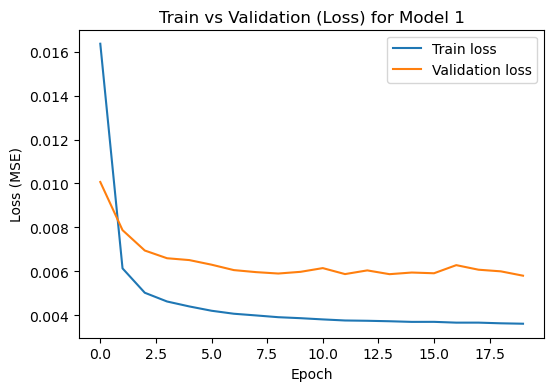

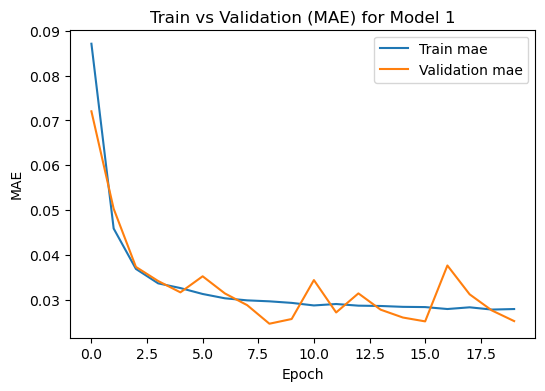

In [44]:
# Menampilkan plot hasil pelatihan dengan memanggil fungsi plot_loss
plot_loss(history_1, 'Model 1')
plot_mae(history_1, 'Model 1')

In [45]:
# menampilkan hasil evaluasi model
eval_df(model_1, X_train_window_1, X_val_window_1, X_test_window_1, y_train_window_1, y_val_window_1, y_test_window_1)

60/60 [==============================] - 1s 14ms/step - loss: 0.0069 - mean_absolute_error: 0.0408 - root_mean_squared_error: 0.0833


,MAE,MSE,RMSE
Train,0.0265,0.0037,0.0605
Val,0.0253,0.0058,0.0762
Test,0.0408,0.0069,0.0833


60/60 [==============================] - 1s 11ms/step


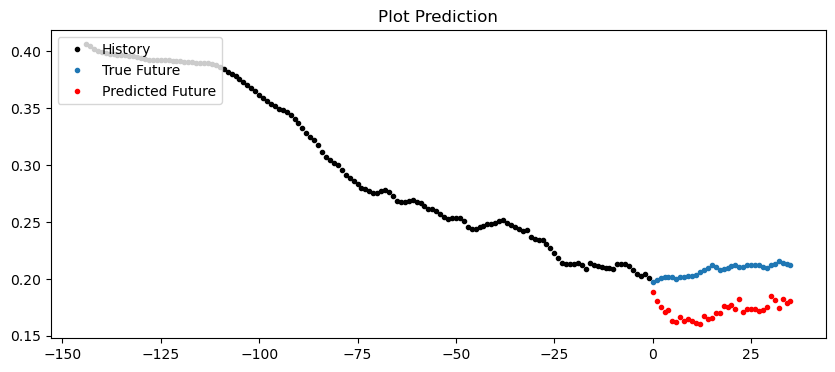

60/60 [==============================] - 1s 11ms/step


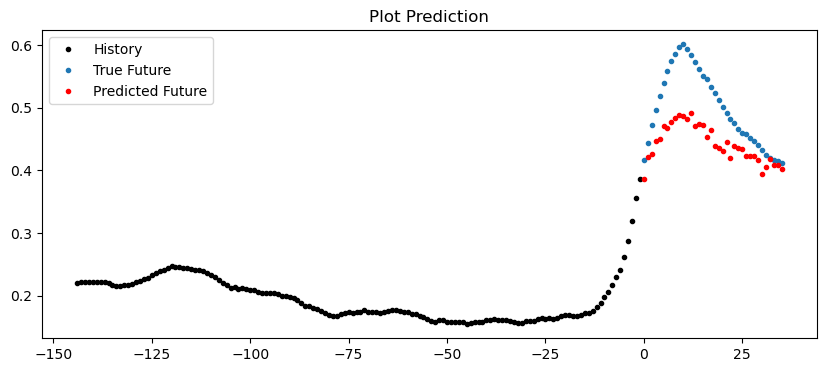

60/60 [==============================] - 1s 12ms/step


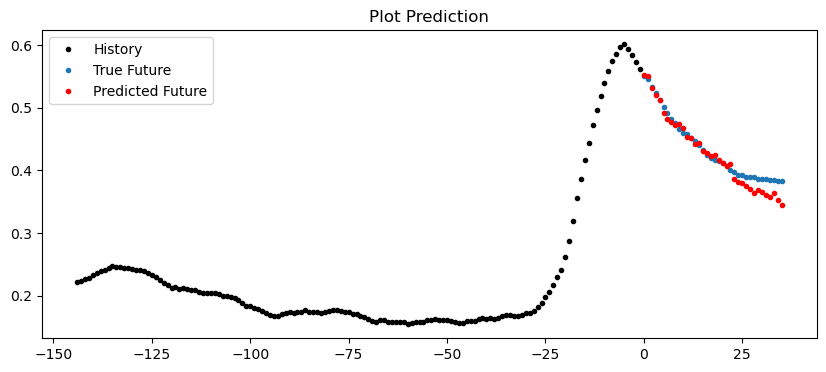

60/60 [==============================] - 1s 12ms/step


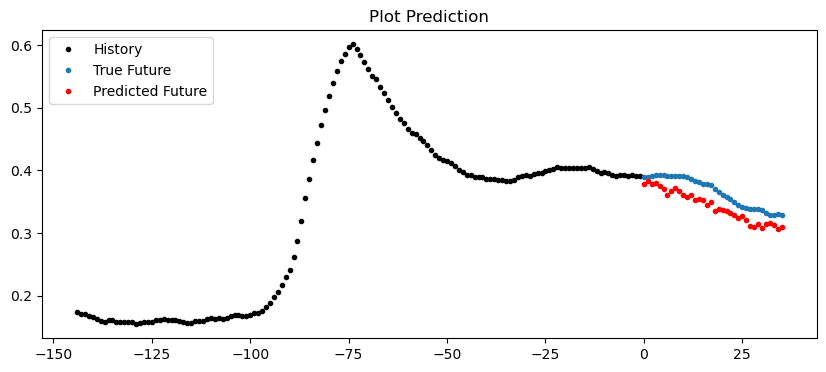

In [46]:
# prediksi
for i in [795, 1001, 1016, 1085]:
    plot_pred0(y_test_window_1[(i-window_size_1):i, 0], 
              y_test_window_1[i], 
              model_1.predict(X_test_window_1)[i])

60/60 [==============================] - 1s 12ms/step


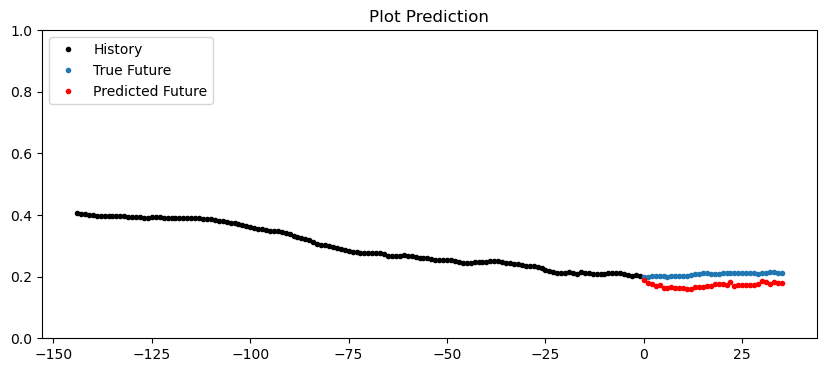

60/60 [==============================] - 1s 11ms/step


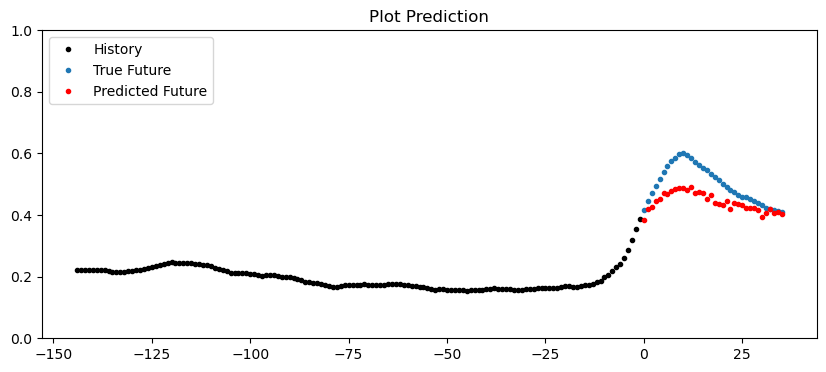

60/60 [==============================] - 1s 12ms/step


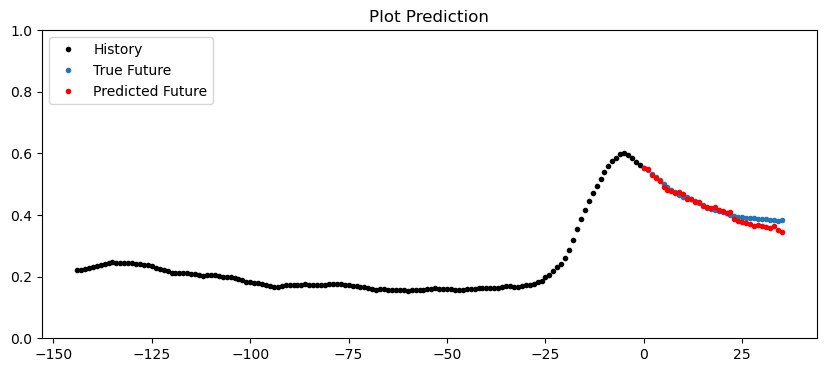

60/60 [==============================] - 1s 12ms/step


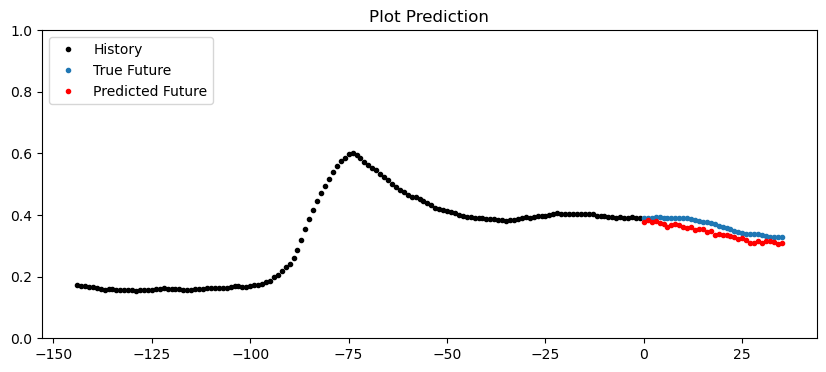

In [47]:
# prediksi
for i in [795, 1001, 1016, 1085]:
    plot_pred1(y_test_window_1[(i-window_size_1):i, 0], 
              y_test_window_1[i], 
              model_1.predict(X_test_window_1)[i])

### Model 2 (window-2)

In [48]:
# Membuat model GRU
model_2 = Sequential()
model_2.add(GRU(window_size_2, 
                input_shape=(window_size_2, X_train.shape[1]), 
                return_sequences=False))
model_2.add(Dense(future_size_2))
model_2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_1 (GRU)                 (None, 144)               65232     
                                                                 
 dense_1 (Dense)             (None, 72)                10440     
                                                                 
Total params: 75,672
Trainable params: 75,672
Non-trainable params: 0
_________________________________________________________________


In [49]:
model_2.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=Adam(lr=0.0001), 
                metrics=[tf.keras.metrics.MeanAbsoluteError(),
                         tf.keras.metrics.RootMeanSquaredError()])

early_stopping = EarlyStopping(monitor='val_loss', 
                               patience=PATIENCE, 
                               verbose=1, 
                               restore_best_weights=True)

history_2 = model_2.fit(X_train_window_2, y_train_window_2, 
                        validation_data=(X_val_window_2, y_val_window_2),
                        epochs=EPOCHS, batch_size=32,
                        callbacks=[early_stopping])

Epoch 1/20
298/298 [==============================] - 10s 28ms/step - loss: 0.0154 - mean_absolute_error: 0.0834 - root_mean_squared_error: 0.1239 - val_loss: 0.0119 - val_mean_absolute_error: 0.0772 - val_root_mean_squared_error: 0.1091
Epoch 2/20
298/298 [==============================] - 7s 25ms/step - loss: 0.0087 - mean_absolute_error: 0.0546 - root_mean_squared_error: 0.0932 - val_loss: 0.0099 - val_mean_absolute_error: 0.0553 - val_root_mean_squared_error: 0.0997
Epoch 3/20
298/298 [==============================] - 8s 26ms/step - loss: 0.0079 - mean_absolute_error: 0.0485 - root_mean_squared_error: 0.0888 - val_loss: 0.0094 - val_mean_absolute_error: 0.0446 - val_root_mean_squared_error: 0.0970
Epoch 4/20
298/298 [==============================] - 8s 26ms/step - loss: 0.0075 - mean_absolute_error: 0.0454 - root_mean_squared_error: 0.0868 - val_loss: 0.0096 - val_mean_absolute_error: 0.0492 - val_root_mean_squared_error: 0.0981
Epoch 5/20
298/298 [==============================]

#### Result

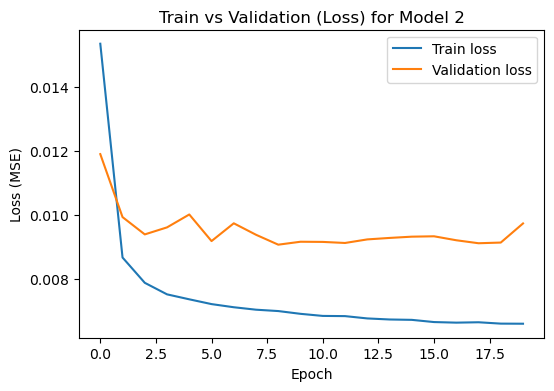

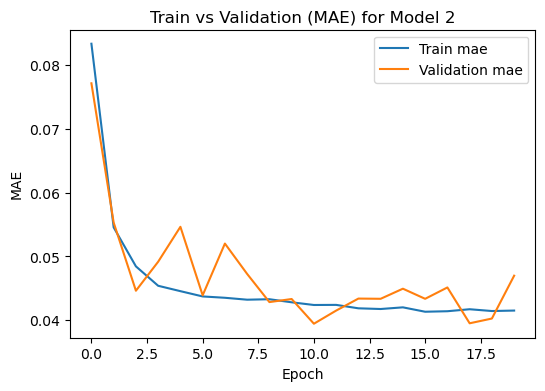

In [50]:
#Menampilkan plot hasil pelatihan dengan memanggil fungsi plot_loss
plot_loss(history_2, 'Model 2')
plot_mae(history_2, 'Model 2')

In [51]:
# menampilkan hasil evaluasi model
eval_df(model_2, X_train_window_2, X_val_window_2, X_test_window_2, y_train_window_2, y_val_window_2, y_test_window_2)

59/59 [==============================] - 1s 13ms/step - loss: 0.0120 - mean_absolute_error: 0.0566 - root_mean_squared_error: 0.1096


,MAE,MSE,RMSE
Train,0.0442,0.0066,0.0814
Val,0.0470,0.0097,0.0987
Test,0.0566,0.0120,0.1096


59/59 [==============================] - 1s 12ms/step


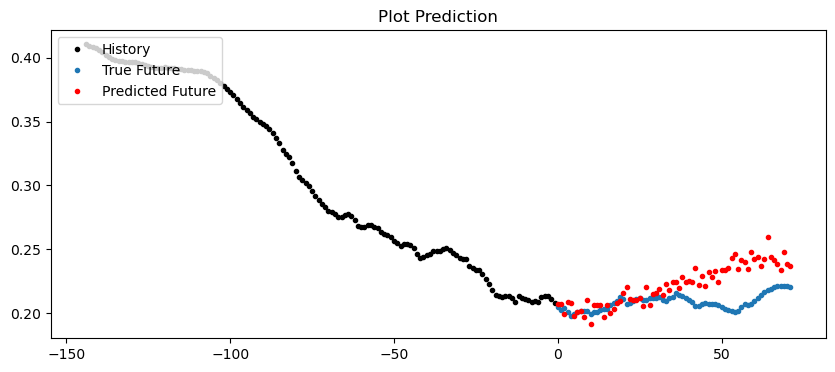

59/59 [==============================] - 1s 12ms/step


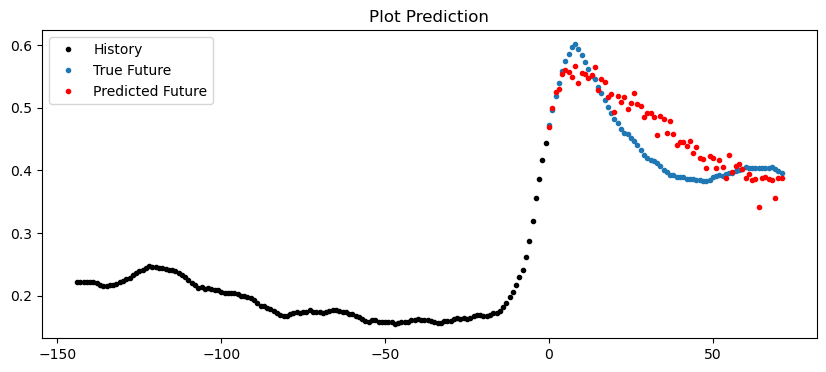

59/59 [==============================] - 1s 12ms/step


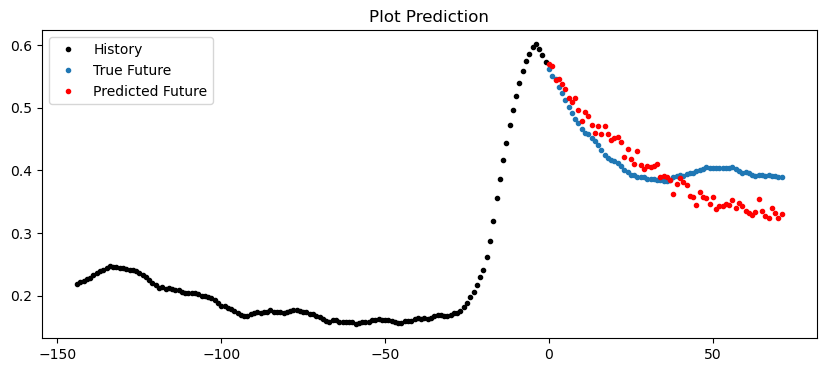

59/59 [==============================] - 1s 10ms/step


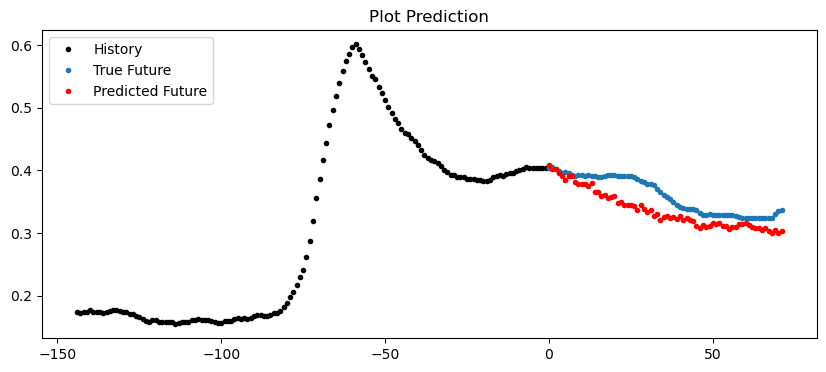

In [52]:
# prediksi 
for i in [791, 1003, 1015, 1070]:
    plot_pred0(y_test_window_2[(i-window_size_2):i, 0], 
              y_test_window_2[i], 
              model_2.predict(X_test_window_2)[i])

59/59 [==============================] - 1s 12ms/step


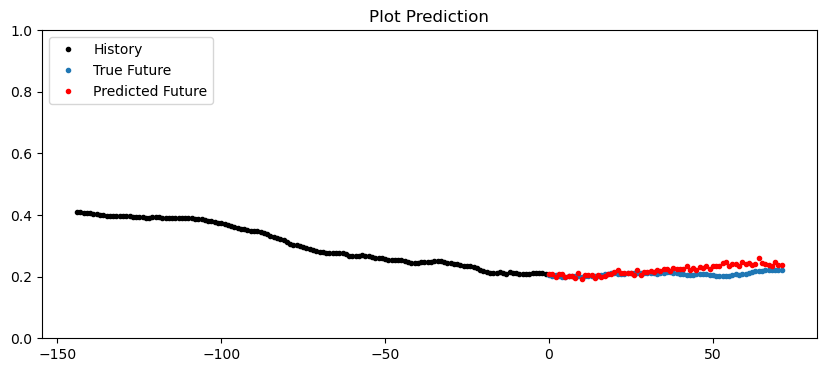

59/59 [==============================] - 1s 12ms/step


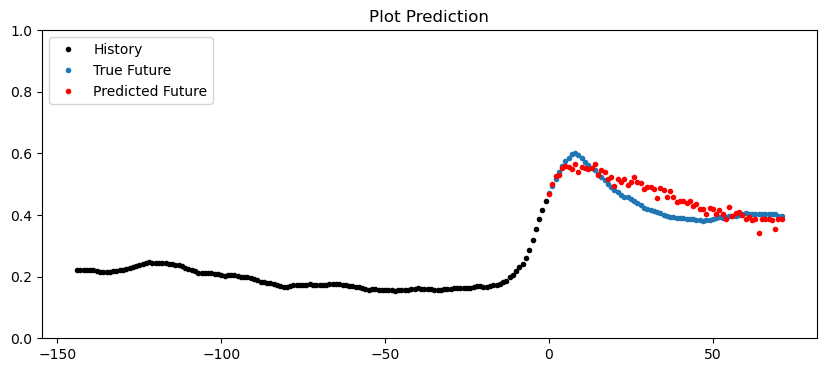

59/59 [==============================] - 1s 12ms/step


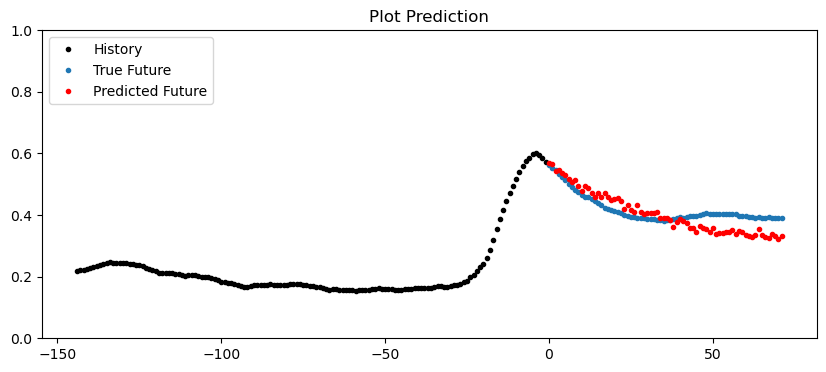

59/59 [==============================] - 1s 12ms/step


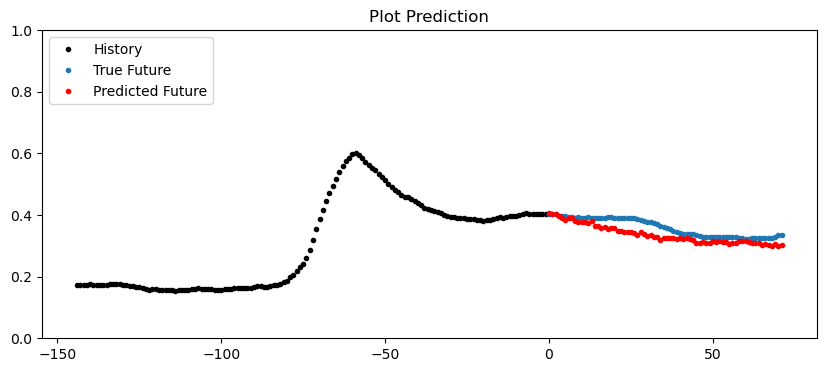

In [53]:
# prediksi 
for i in [791, 1003, 1015, 1070]:
    plot_pred1(y_test_window_2[(i-window_size_2):i, 0], 
              y_test_window_2[i], 
              model_2.predict(X_test_window_2)[i])

### Model 3 (window-3)

In [54]:
# Membuat model GRU
model_3 = Sequential()
model_3.add(GRU(window_size_3, 
                input_shape=(window_size_3, X_train.shape[1]), 
                return_sequences=False))
model_3.add(Dense(future_size_3))
model_3.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_3 (GRU)                 (None, 288)               254880    
                                                                 
 dense_3 (Dense)             (None, 36)                10404     
                                                                 
Total params: 265,284
Trainable params: 265,284
Non-trainable params: 0
_________________________________________________________________


In [55]:
model_3.compile(loss=tf.keras.losses.MeanSquaredError(), 
                optimizer=Adam(lr=0.0001), 
                metrics=[tf.keras.metrics.MeanAbsoluteError(),
                         tf.keras.metrics.RootMeanSquaredError()])

early_stopping = EarlyStopping(monitor='val_loss', 
                               patience=PATIENCE, 
                               verbose=1, 
                               restore_best_weights=True)

history_3 = model_3.fit(X_train_window_3, y_train_window_3, 
                        validation_data=(X_val_window_3, y_val_window_3),
                        epochs=EPOCHS, batch_size=32,
                        callbacks=[early_stopping])

Epoch 1/20
294/294 [==============================] - 26s 77ms/step - loss: 0.0108 - mean_absolute_error: 0.0653 - root_mean_squared_error: 0.1038 - val_loss: 0.0091 - val_mean_absolute_error: 0.0578 - val_root_mean_squared_error: 0.0956
Epoch 2/20
294/294 [==============================] - 23s 78ms/step - loss: 0.0051 - mean_absolute_error: 0.0359 - root_mean_squared_error: 0.0711 - val_loss: 0.0074 - val_mean_absolute_error: 0.0406 - val_root_mean_squared_error: 0.0861
Epoch 3/20
294/294 [==============================] - 26s 90ms/step - loss: 0.0046 - mean_absolute_error: 0.0328 - root_mean_squared_error: 0.0676 - val_loss: 0.0070 - val_mean_absolute_error: 0.0355 - val_root_mean_squared_error: 0.0837
Epoch 4/20
294/294 [==============================] - 29s 97ms/step - loss: 0.0043 - mean_absolute_error: 0.0316 - root_mean_squared_error: 0.0657 - val_loss: 0.0072 - val_mean_absolute_error: 0.0435 - val_root_mean_squared_error: 0.0850
Epoch 5/20
294/294 [============================

#### Result

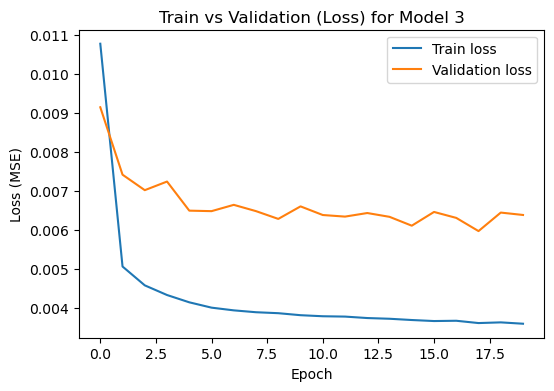

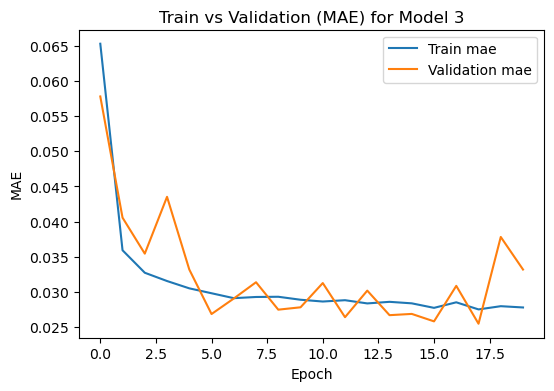

In [56]:
#Menampilkan plot hasil pelatihan dengan memanggil fungsi plot_loss
plot_loss(history_3, 'Model 3')
plot_mae(history_3, 'Model 3')

In [57]:
# menampilkan hasil evaluasi model
eval_df(model_3, X_train_window_3, X_val_window_3, X_test_window_3, y_train_window_3, y_val_window_3, y_test_window_3)

55/55 [==============================] - 2s 32ms/step - loss: 0.0060 - mean_absolute_error: 0.0370 - root_mean_squared_error: 0.0776


,MAE,MSE,RMSE
Train,0.0306,0.0036,0.0599
Val,0.0332,0.0064,0.0798
Test,0.0370,0.0060,0.0776


55/55 [==============================] - 2s 32ms/step


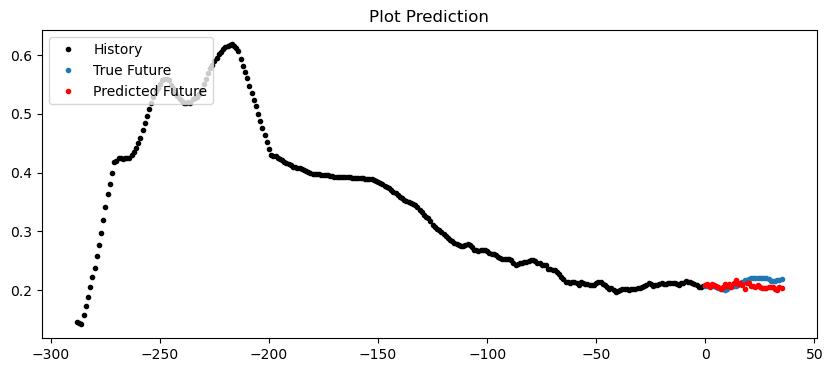

55/55 [==============================] - 2s 32ms/step


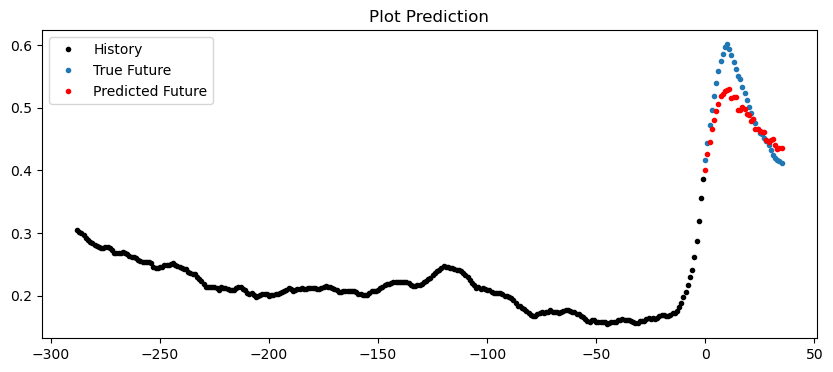

55/55 [==============================] - 2s 32ms/step


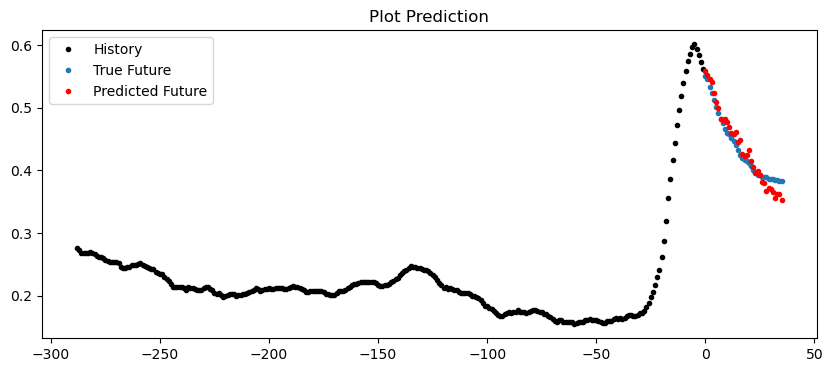

55/55 [==============================] - 2s 31ms/step


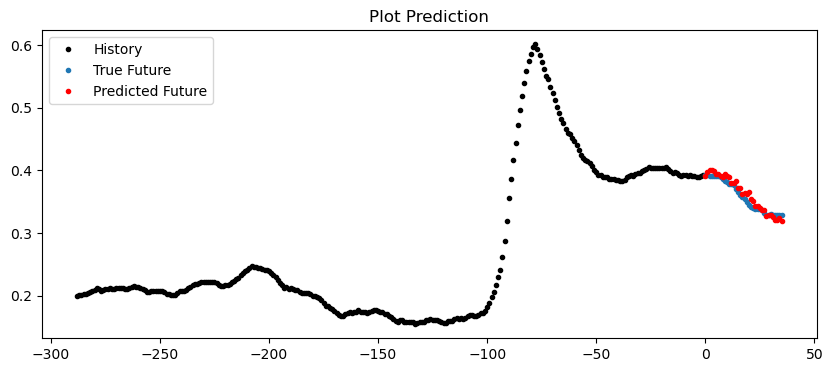

In [58]:
# prediksi
for i in [692,857,872,945]:
    plot_pred0(y_test_window_3[(i-window_size_3):i, 0], 
              y_test_window_3[i], 
              model_3.predict(X_test_window_3)[i])

55/55 [==============================] - 2s 31ms/step


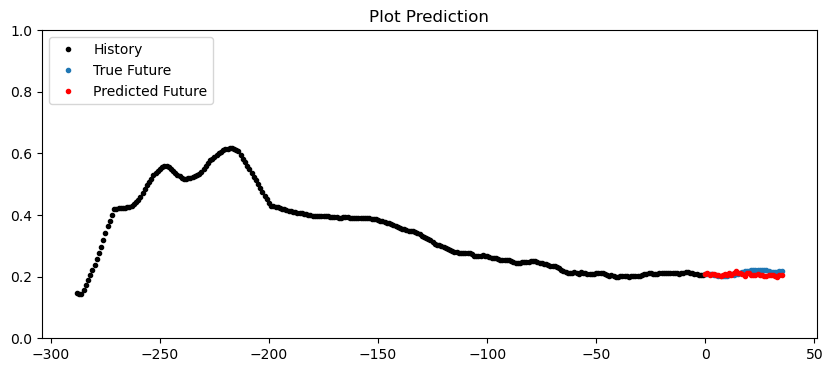

55/55 [==============================] - 2s 31ms/step


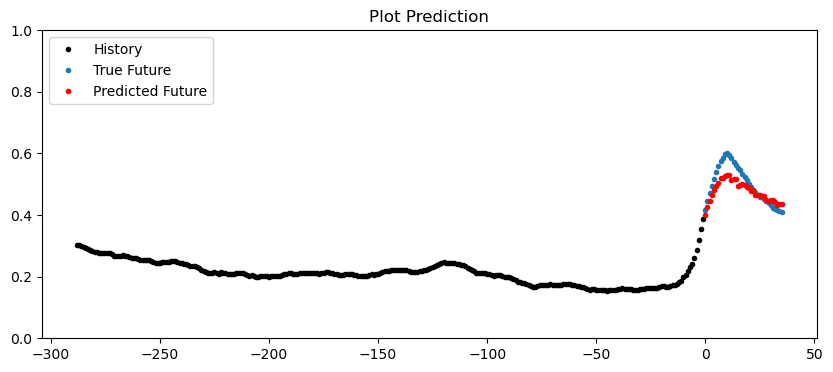

55/55 [==============================] - 2s 31ms/step


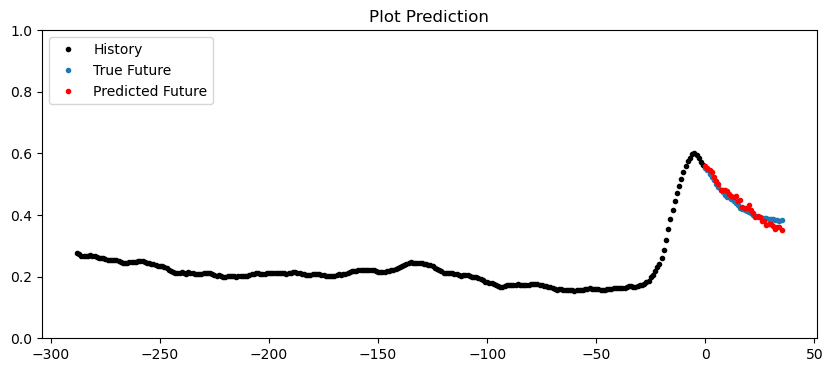

55/55 [==============================] - 2s 35ms/step


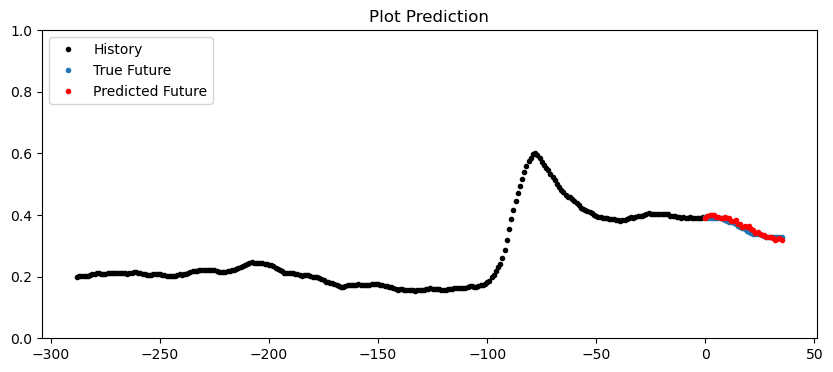

In [59]:
# prediksi
for i in [692,857,872,945]:
    plot_pred1(y_test_window_3[(i-window_size_3):i, 0], 
              y_test_window_3[i], 
              model_3.predict(X_test_window_3)[i])

### Model 4 (window-4)

In [60]:
# Membuat model GRU
model_4 = Sequential()
model_4.add(GRU(window_size_4, 
                input_shape=(window_size_4, X_train.shape[1]), 
                return_sequences=False))
model_4.add(Dense(future_size_4))
model_4.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_3 (GRU)                 (None, 288)               254880    
                                                                 
 dense_3 (Dense)             (None, 72)                20808     
                                                                 
Total params: 275,688
Trainable params: 275,688
Non-trainable params: 0
_________________________________________________________________


In [61]:
# Compile
model_4.compile(loss=tf.keras.losses.MeanSquaredError(), 
                optimizer=Adam(lr=0.0001),
                metrics=[tf.keras.metrics.MeanAbsoluteError(),
                         tf.keras.metrics.RootMeanSquaredError()])

early_stopping = EarlyStopping(monitor='val_loss', 
                               patience=PATIENCE, 
                               verbose=1, 
                               restore_best_weights=True)

history_4 = model_4.fit(X_train_window_4, y_train_window_4, 
                        validation_data=(X_val_window_4, y_val_window_4),
                        epochs=EPOCHS,  batch_size=32,
                        callbacks=[early_stopping])

Epoch 1/20
293/293 [==============================] - 32s 104ms/step - loss: 0.0126 - mean_absolute_error: 0.0716 - root_mean_squared_error: 0.1124 - val_loss: 0.0107 - val_mean_absolute_error: 0.0553 - val_root_mean_squared_error: 0.1033
Epoch 2/20
293/293 [==============================] - 35s 119ms/step - loss: 0.0080 - mean_absolute_error: 0.0479 - root_mean_squared_error: 0.0892 - val_loss: 0.0110 - val_mean_absolute_error: 0.0579 - val_root_mean_squared_error: 0.1047
Epoch 3/20
293/293 [==============================] - 30s 101ms/step - loss: 0.0076 - mean_absolute_error: 0.0455 - root_mean_squared_error: 0.0870 - val_loss: 0.0100 - val_mean_absolute_error: 0.0458 - val_root_mean_squared_error: 0.1002
Epoch 4/20
293/293 [==============================] - 30s 102ms/step - loss: 0.0073 - mean_absolute_error: 0.0444 - root_mean_squared_error: 0.0857 - val_loss: 0.0098 - val_mean_absolute_error: 0.0423 - val_root_mean_squared_error: 0.0989
Epoch 5/20
293/293 [========================

#### Result

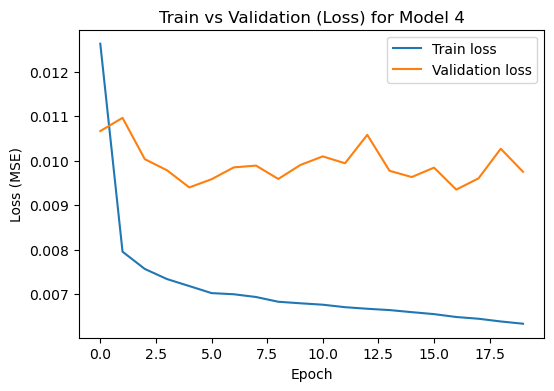

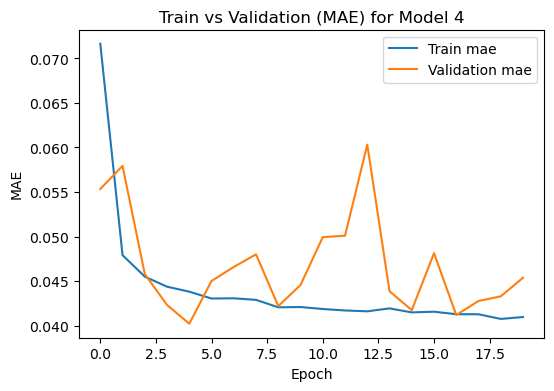

In [62]:
#Menampilkan plot hasil pelatihan dengan memanggil fungsi plot_loss
plot_loss(history_4, 'Model 4')
plot_mae(history_4, 'Model 4')

In [63]:
# menampilkan hasil evaluasi model
eval_df(model_4, X_train_window_4, X_val_window_4, X_test_window_4, y_train_window_4, y_val_window_4, y_test_window_4)

54/54 [==============================] - 2s 33ms/step - loss: 0.0136 - mean_absolute_error: 0.0606 - root_mean_squared_error: 0.1168


,MAE,MSE,RMSE
Train,0.0415,0.0062,0.0789
Val,0.0454,0.0098,0.0987
Test,0.0606,0.0136,0.1168


54/54 [==============================] - 2s 32ms/step


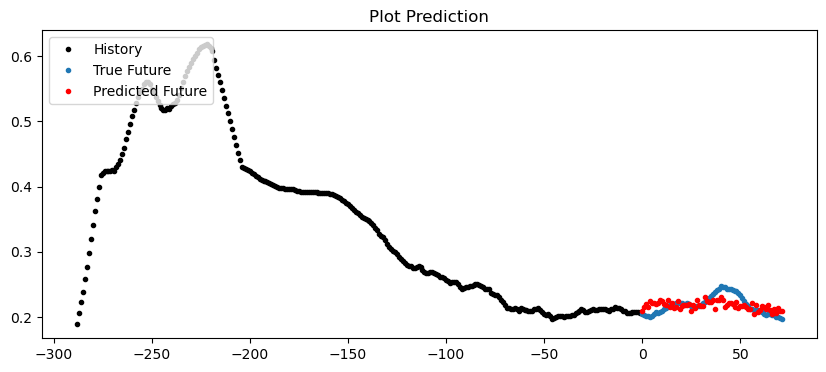

54/54 [==============================] - 2s 32ms/step


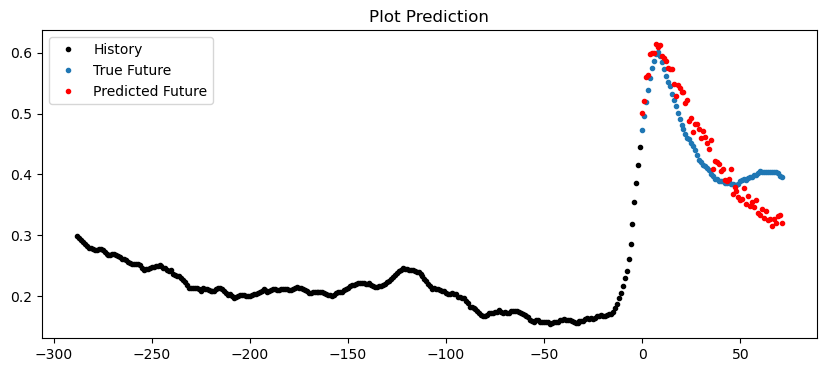

54/54 [==============================] - 2s 33ms/step


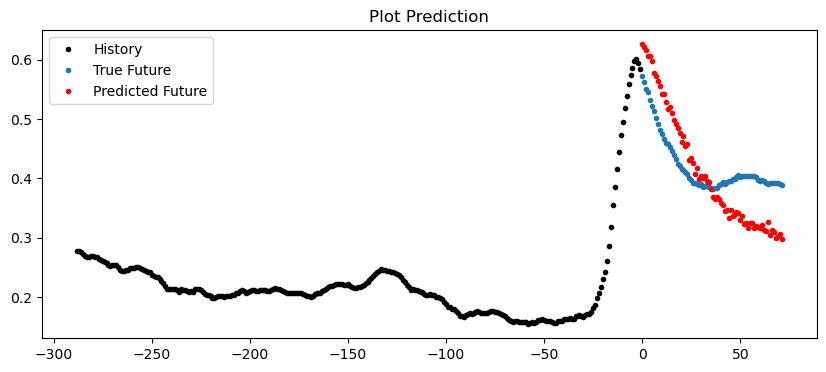

54/54 [==============================] - 2s 34ms/step


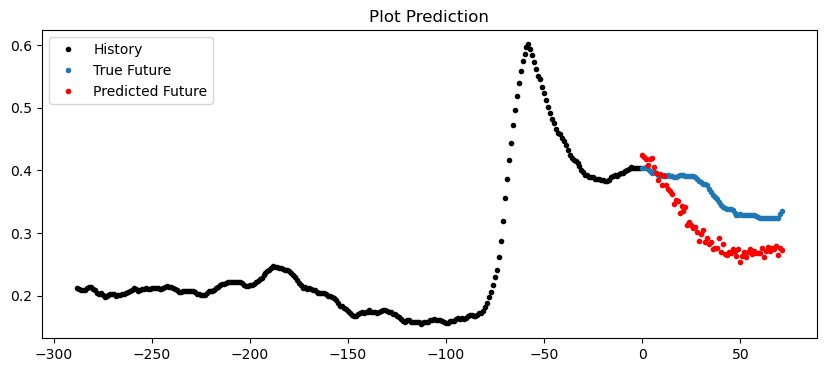

In [64]:
# prediksi
for i in [697,859,870,925]:
    plot_pred0(y_test_window_4[(i-window_size_4):i, 0], 
              y_test_window_4[i], 
              model_4.predict(X_test_window_4)[i])

54/54 [==============================] - 2s 31ms/step


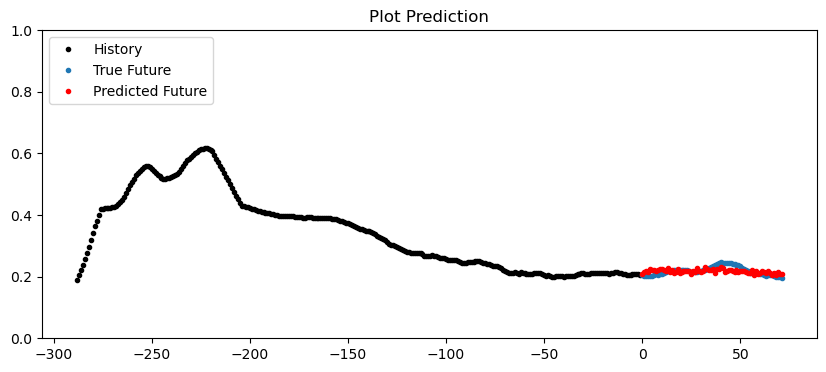

54/54 [==============================] - 2s 31ms/step


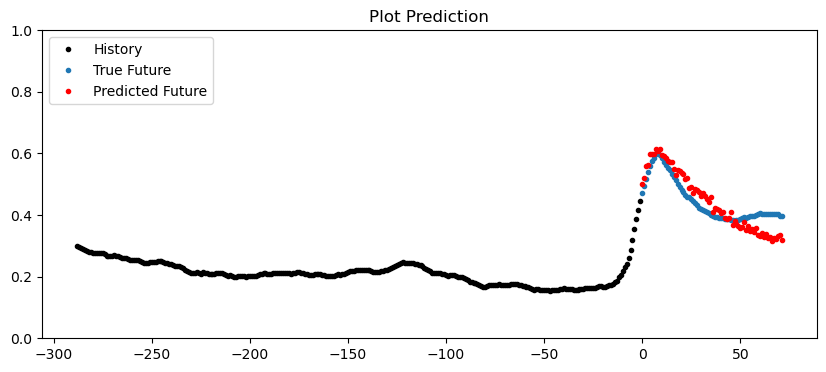

54/54 [==============================] - 2s 32ms/step


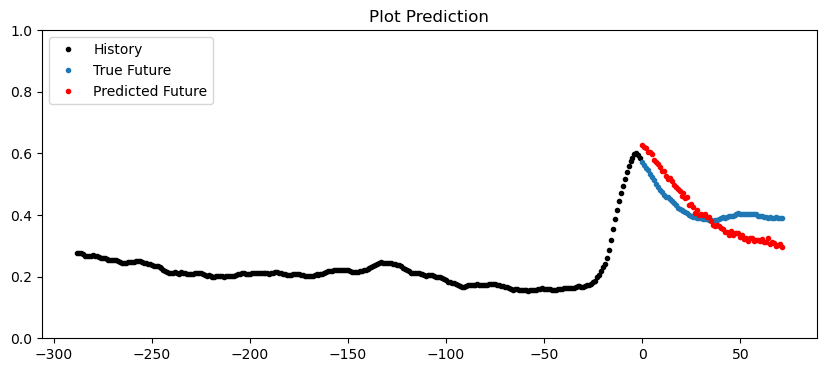

54/54 [==============================] - 2s 32ms/step


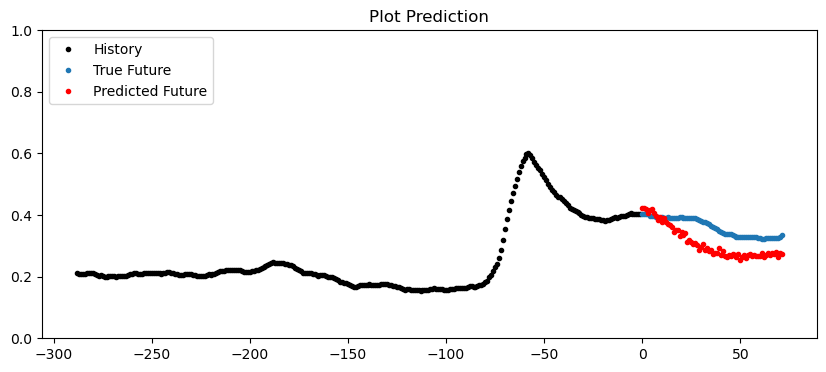

In [65]:
# prediksi
for i in [697,859,870,925]:
    plot_pred1(y_test_window_4[(i-window_size_4):i, 0], 
              y_test_window_4[i], 
              model_4.predict(X_test_window_4)[i])

### Tuning Hyperparameter

MODEL dengan window (3) memiliki hasil evaluasi terbaik, selanjutnya akan dilakukan tuning hyperparameter untuk meningkatkan hasil evaluasi

In [57]:
del model_tuned

In [58]:
# TUNING HYPERPARAMETER
'''
    - penambahan layer gru dan dense ------------> agar dapat menangkap lebih banyak pola
    - aktivasi: tanh   --------------------------> mengatasi vanishing gradient
    - kernel initializer: glorot normal  --------> inisialisasi bobot
    - bias initializer: zeros -------------------> inisialisasi bias
    - penambahan epoch: 50  ---------------------> menambah iterasi training model
    - penyesuaian learning rate: lr scheduler ---> mengatur laju pembelajaran, biasanya makin lama iterasi diatur makin kecil
'''

model_tuned = Sequential()
model_tuned.add(GRU(256, 
                    input_shape=(window_size_3, X_train.shape[1]), 
                    activation='tanh',
                    return_sequences=True,
                    kernel_initializer=GlorotNormal(),
                    bias_initializer=Zeros()
                   ))
model_tuned.add(GRU(128,  
                    activation='tanh',
                    return_sequences=True,
                    kernel_initializer=GlorotNormal(),
                    bias_initializer=Zeros()
                   ))
model_tuned.add(GRU(64,  
                    activation='tanh',
                    return_sequences=True,
                    kernel_initializer=GlorotNormal(),
                    bias_initializer=Zeros()
                   ))
model_tuned.add(GRU(64,  
                    activation='tanh',
                    return_sequences=False,
                    kernel_initializer=GlorotNormal(),
                    bias_initializer=Zeros()
                   ))
model_tuned.add(Dense(64,
                      activation='tanh', 
                      kernel_initializer=GlorotNormal(),
                      bias_initializer=Zeros()
                     ))
model_tuned.add(Dense(future_size_3,
                      activation='tanh', 
                      kernel_initializer=GlorotNormal(),
                      bias_initializer=Zeros()
                     ))
model_tuned.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_8 (GRU)                 (None, 288, 256)          201984    
                                                                 
 gru_9 (GRU)                 (None, 288, 128)          148224    
                                                                 
 gru_10 (GRU)                (None, 288, 64)           37248     
                                                                 
 gru_11 (GRU)                (None, 64)                24960     
                                                                 
 dense_4 (Dense)             (None, 64)                4160      
                                                                 
 dense_5 (Dense)             (None, 36)                2340      
                                                                 
Total params: 418,916
Trainable params: 418,916
Non-tr

In [59]:
model_tuned.compile(loss=tf.keras.losses.MeanSquaredError(), 
                    optimizer=Adam(lr=0.0001), 
                    metrics=[tf.keras.metrics.MeanAbsoluteError(),
                             tf.keras.metrics.RootMeanSquaredError()])

# Define learning rate scheduler callback
lr_scheduler = LearningRateScheduler(lr_schedule)

early_stopping = EarlyStopping(monitor='val_loss', 
                               patience=50, 
                               verbose=1, 
                               restore_best_weights=True)

history_tuned = model_tuned.fit(X_train_window_3, y_train_window_3, 
                                validation_data=(X_val_window_3, y_val_window_3),
                                epochs=50, batch_size=32,
                                callbacks=[early_stopping,lr_scheduler])

Epoch 1/50
294/294 [==============================] - 56s 163ms/step - loss: 0.0102 - mean_absolute_error: 0.0609 - root_mean_squared_error: 0.1011 - val_loss: 0.0080 - val_mean_absolute_error: 0.0385 - val_root_mean_squared_error: 0.0893 - lr: 1.0000e-04
Epoch 2/50
294/294 [==============================] - 48s 163ms/step - loss: 0.0054 - mean_absolute_error: 0.0364 - root_mean_squared_error: 0.0732 - val_loss: 0.0077 - val_mean_absolute_error: 0.0428 - val_root_mean_squared_error: 0.0875 - lr: 1.0000e-04
Epoch 3/50
294/294 [==============================] - 48s 164ms/step - loss: 0.0049 - mean_absolute_error: 0.0344 - root_mean_squared_error: 0.0702 - val_loss: 0.0069 - val_mean_absolute_error: 0.0300 - val_root_mean_squared_error: 0.0833 - lr: 1.0000e-04
Epoch 4/50
294/294 [==============================] - 51s 172ms/step - loss: 0.0046 - mean_absolute_error: 0.0329 - root_mean_squared_error: 0.0677 - val_loss: 0.0066 - val_mean_absolute_error: 0.0282 - val_root_mean_squared_error: 

#### Result

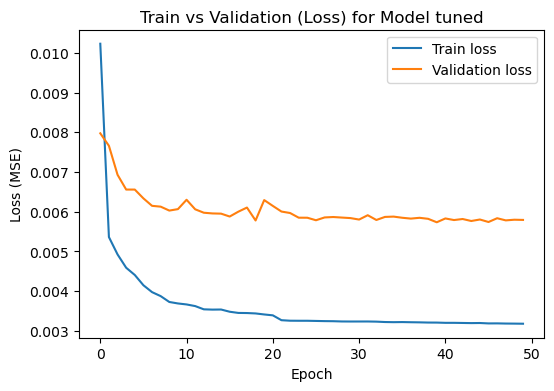

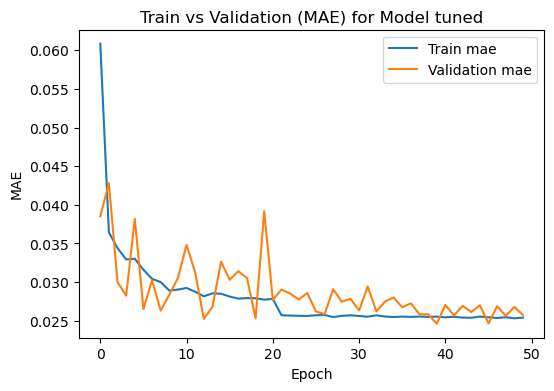

In [60]:
#Menampilkan plot hasil pelatihan dengan memanggil fungsi plot_loss
plot_loss(history_tuned, 'Model tuned')
plot_mae(history_tuned, 'Model tuned')

In [61]:
# menampilkan hasil evaluasi model
eval_df(model_tuned, X_train_window_3, X_val_window_3, X_test_window_3, y_train_window_3, y_val_window_3, y_test_window_3)

55/55 [==============================] - 4s 67ms/step - loss: 0.0062 - mean_absolute_error: 0.0365 - root_mean_squared_error: 0.0784


,MAE,MSE,RMSE
Train,0.0246,0.0032,0.0564
Val,0.0257,0.0058,0.0761
Test,0.0365,0.0062,0.0784


55/55 [==============================] - 5s 61ms/step


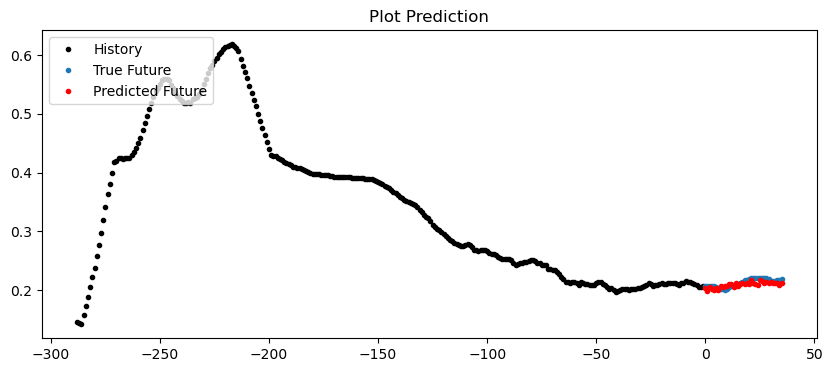

55/55 [==============================] - 4s 65ms/step


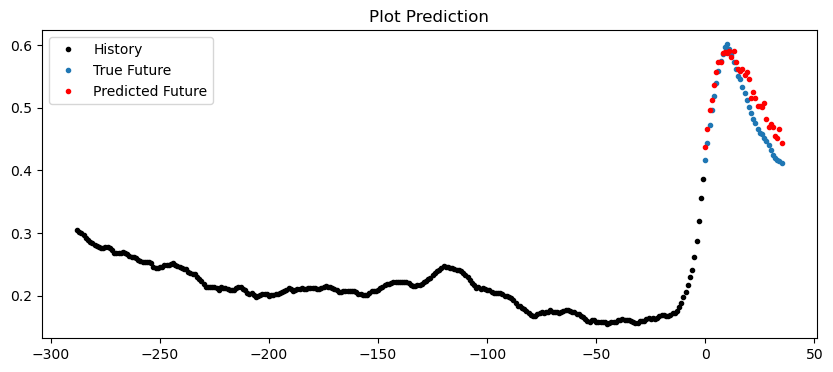

55/55 [==============================] - 4s 65ms/step


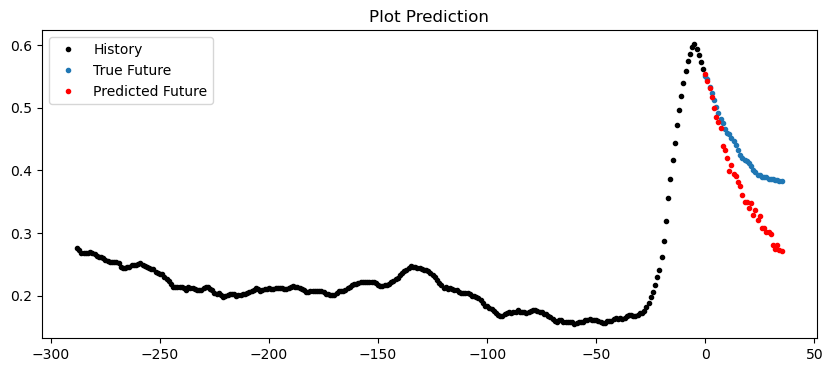

55/55 [==============================] - 4s 66ms/step


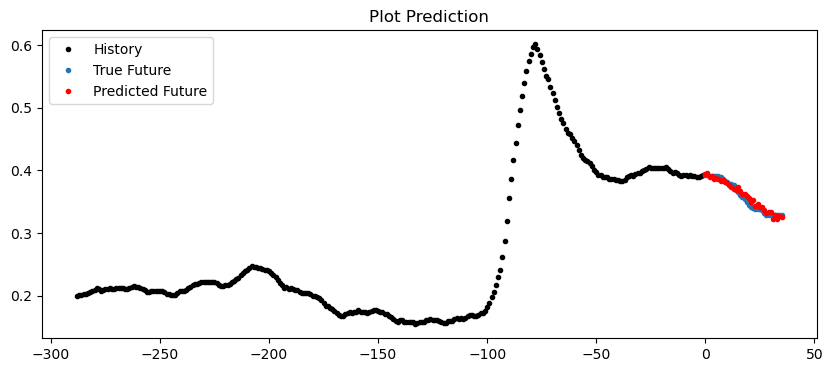

In [62]:
# prediksi
for i in [692,857, 872, 945]:
    plot_pred0(y_test_window_3[(i-window_size_3):i, 0], 
              y_test_window_3[i], 
              model_tuned.predict(X_test_window_3)[i])

55/55 [==============================] - 4s 70ms/step


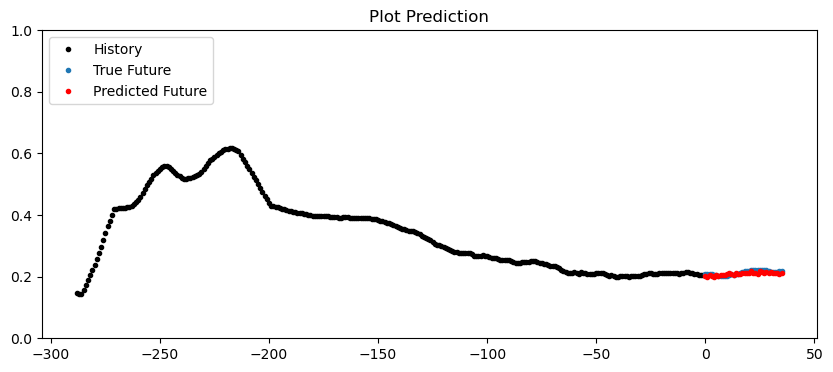

55/55 [==============================] - 3s 64ms/step


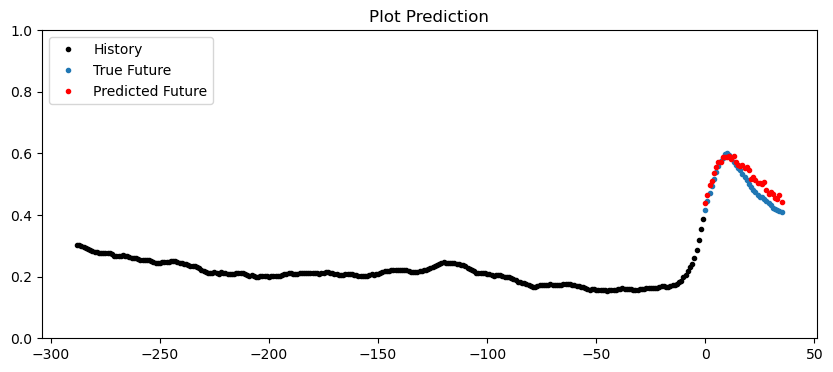

55/55 [==============================] - 3s 64ms/step


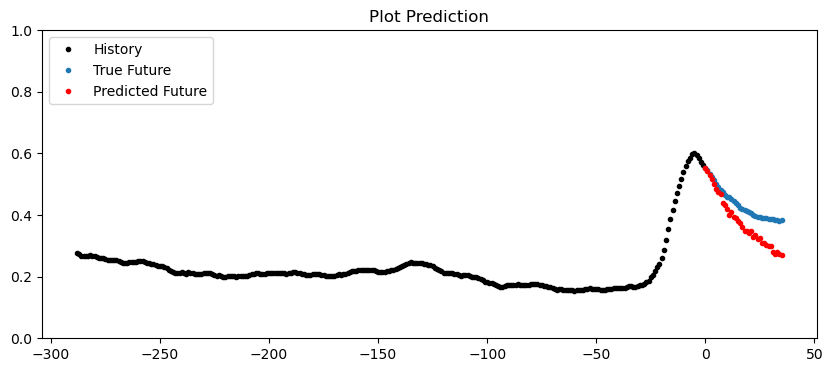

55/55 [==============================] - 4s 64ms/step


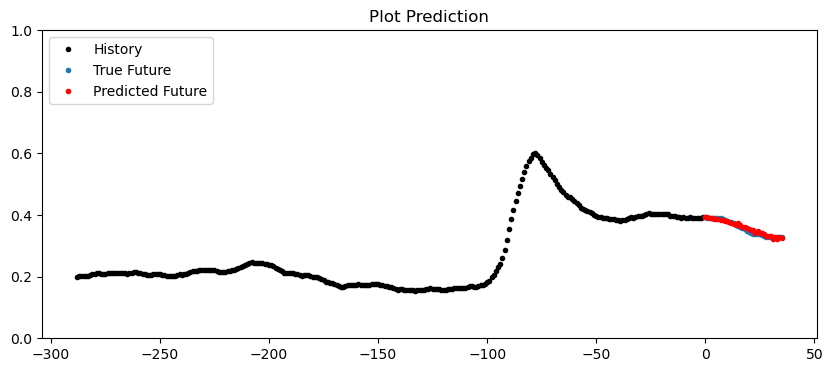

In [63]:
# prediksi
for i in [692,857,872,945]:
    plot_pred1(y_test_window_3[(i-window_size_3):i, 0], 
              y_test_window_3[i], 
              model_tuned.predict(X_test_window_3)[i])

Hasil evaluasi meningkat setelah tuning hyperparameter (dapat memprediksi puncak lebih akurat)

## - SAVE MODEL

In [64]:
# save model dalam format .h5
model_tuned.save('model/model_A2/model_prediksi_flood-A2.h5')

In [65]:
# Memuat model dari format HDF5
from tensorflow.keras.models import load_model
loaded_model = load_model('model/model_A2/model_prediksi_flood-A2.h5')

In [66]:
# menampilkan hasil evaluasi model
eval_df(loaded_model, X_train_window_3, X_val_window_3, X_test_window_3, y_train_window_3, y_val_window_3, y_test_window_3)

55/55 [==============================] - 4s 71ms/step - loss: 0.0062 - mean_absolute_error: 0.0365 - root_mean_squared_error: 0.0784


,MAE,MSE,RMSE
Train,0.0246,0.0032,0.0564
Val,0.0257,0.0058,0.0761
Test,0.0365,0.0062,0.0784


Hasil evaluasi sama

---